# Life Expectancy

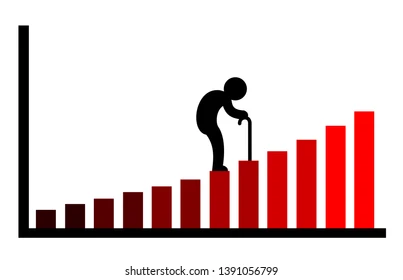

Context

Although there have been lot of studies undertaken in the past on factors affecting life expectancy considering demographic variables, income composition and mortality rates. It was found that affect of immunization and human development index was not taken into account in the past. Also, some of the past research was done considering multiple linear regression based on data set of one year for all the countries. Hence, this gives motivation to resolve both the factors stated previously by formulating a regression model based on mixed effects model and multiple linear regression while considering data from a period of 2000 to 2015 for all the countries. Important immunization like Hepatitis B, Polio and Diphtheria will also be considered. In a nutshell, this study will focus on immunization factors, mortality factors, economic factors, social factors and other health related factors as well. Since the observations this dataset are based on different countries, it will be easier for a country to determine the predicting factor which is contributing to lower value of life expectancy. This will help in suggesting a country which area should be given importance in order to efficiently improve the life expectancy of its population.

Content

The project relies on accuracy of data. The Global Health Observatory (GHO) data repository under World Health Organization (WHO) keeps track of the health status as well as many other related factors for all countries The data-sets are made available to public for the purpose of health data analysis. 
The data-set related to life expectancy, health factors for 193 countries has been collected from the same WHO data repository website and its corresponding economic data was collected from United Nation website. 
Among all categories of health-related factors only those critical factors were chosen which are more representative. 
It has been observed that in the past 15 years , there has been a huge development in health sector resulting in improvement of human mortality rates especially in the developing nations in comparison to the past 30 years. 
Therefore, in this project we have considered data from year 2000-2015 for 193 countries for further analysis.
The individual data files have been merged together into a single data-set. 
On initial visual inspection of the data showed some missing values. 

As the data-sets were from WHO, we found no evident errors. The result indicated that most of the missing data was for population and GDP.

The final merged file(final dataset) consists of 22 Columns and 2938 rows

All predicting variables was then divided into several broad categories:

Immunization related factors, Mortality factors, Economical factors and Social factors.

The data-set aims to answer the following key questions:



How does Infant and Adult mortality rates affect life expectancy?


What is the impact of schooling on the lifespan of humans?


Does Life Expectancy have positive or negative relationship with drinking alcohol?


Does immunization help increase the life expectancy?


Does income composition affect life expectancy?




## Changing current working directory

In [65]:

import os
os.chdir(r'C:\Users\sajit\OneDrive\Desktop\Python Project\Personal Project')
os.getcwd()

'C:\\Users\\sajit\\OneDrive\\Desktop\\Python Project\\Personal Project'

#  Importing the package

In [1]:
# Importing the numpy and pandas package
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O 

# Data Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import plotly.express as px

# Model Building

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, confusion_matrix
from sklearn.model_selection import cross_val_score

# suppressing warnings
import warnings
warnings.filterwarnings('ignore')

### Reading Data

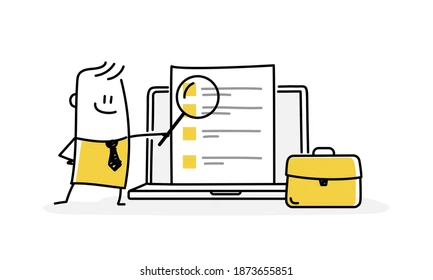

In [2]:
data=pd.read_csv('Life Expectancy Data 1F.csv', na_values=('NA'))

Shape of the Data

In [3]:
data.shape

(2771, 22)

### Understanding the Data

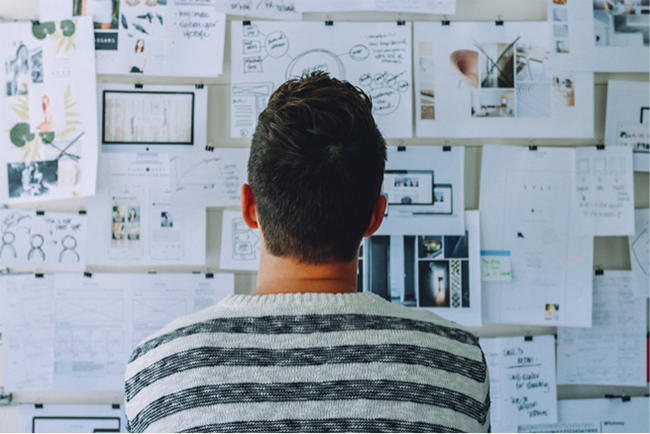

In [159]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2771 entries, 0 to 2770
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2771 non-null   object 
 1   Year                             2771 non-null   int64  
 2   Status                           2771 non-null   object 
 3   Life expectancy                  2771 non-null   float64
 4   Adult Mortality                  2768 non-null   float64
 5   infant deaths                    2771 non-null   int64  
 6   Alcohol                          2588 non-null   float64
 7   percentage expenditure           2771 non-null   float64
 8   Hepatitis B                      2543 non-null   float64
 9   Measles                          2771 non-null   int64  
 10   BMI                             2742 non-null   float64
 11  under-five deaths                2771 non-null   int64  
 12  Polio               

In [160]:
data.head(10)

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.26,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.70,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.74,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.96,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.54,2978599.0,18.2,18.2,0.454,9.5
5,Afghanistan,2010,Developing,58.8,279.0,74,0.01,79.679367,66.0,1989,...,66.0,9.20,66.0,0.1,553.33,2883167.0,18.4,18.4,0.448,9.2
6,Afghanistan,2009,Developing,58.6,281.0,77,0.01,56.762217,63.0,2861,...,63.0,9.42,63.0,0.1,445.89,284331.0,18.6,18.7,0.434,8.9
7,Afghanistan,2008,Developing,58.1,287.0,80,0.03,25.873925,64.0,1599,...,64.0,8.33,64.0,0.1,373.36,2729431.0,18.8,18.9,0.433,8.7
8,Afghanistan,2007,Developing,57.5,295.0,82,0.02,10.910156,63.0,1141,...,63.0,6.73,63.0,0.1,369.84,26616792.0,19.0,19.1,0.415,8.4
9,Afghanistan,2006,Developing,57.3,295.0,84,0.03,17.171518,64.0,1990,...,58.0,7.43,58.0,0.1,272.56,2589345.0,19.2,19.3,0.405,8.1


In [161]:
data.tail(10)

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
2761,Zimbabwe,2009,Developing,50.0,587.0,30,4.64,1.040021,73.0,853,...,69.0,6.26,73.0,18.1,65.82,1381599.0,7.5,7.4,0.419,9.9
2762,Zimbabwe,2008,Developing,48.2,632.0,30,3.56,20.843429,75.0,0,...,75.0,4.96,75.0,20.5,325.68,13558469.0,7.8,7.8,0.421,9.7
2763,Zimbabwe,2007,Developing,46.6,67.0,29,3.88,29.814566,72.0,242,...,73.0,4.47,73.0,23.7,397.00,1332999.0,8.2,8.2,0.414,9.6
2764,Zimbabwe,2006,Developing,45.4,7.0,28,4.57,34.262169,68.0,212,...,71.0,5.12,7.0,26.8,414.80,13124267.0,8.6,8.6,0.408,9.5
2765,Zimbabwe,2005,Developing,44.6,717.0,28,4.14,8.717409,65.0,420,...,69.0,6.44,68.0,30.3,444.77,129432.0,9.0,9.0,0.406,9.3
2766,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,...,67.0,7.13,65.0,33.6,454.37,12777511.0,9.4,9.4,0.407,9.2
2767,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,...,7.0,6.52,68.0,36.7,453.35,12633897.0,9.8,9.9,0.418,9.5
2768,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,...,73.0,6.53,71.0,39.8,57.35,125525.0,1.2,1.3,0.427,10.0
2769,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,...,76.0,6.16,75.0,42.1,548.59,12366165.0,1.6,1.7,0.427,9.8
2770,Zimbabwe,2000,Developing,46.0,665.0,24,1.68,0.000000,79.0,1483,...,78.0,7.10,78.0,43.5,547.36,12222251.0,11.0,11.2,0.434,9.8


In [162]:
# Missing Value Count

data.apply(lambda x: sum(x.isnull()))

Country                              0
Year                                 0
Status                               0
Life expectancy                      0
Adult Mortality                      3
infant deaths                        0
Alcohol                            183
percentage expenditure               0
Hepatitis B                        228
Measles                              0
 BMI                                29
under-five deaths                    0
Polio                               16
Total expenditure                  203
Diphtheria                          16
 HIV/AIDS                            0
GDP                                251
Population                           0
 thinness  1-19 years               29
 thinness 5-9 years                 29
Income composition of resources     90
Schooling                           89
dtype: int64

Reference for Life expectancy missing value filled - https://data.worldbank.org/indicator/SP.DYN.LE00.IN?most_recent_year_desc=false

In [163]:
#calculatin no. of missing values for each column and it's percentage
def percentage_of_miss():
  df1=data[data.columns[data.isnull().sum()>=1]] # I did slicing by condition( I get s subset of dataframe that contains columns that have atleast one missing values) )
  total_miss = df1.isnull().sum().sort_values(ascending=False)
  percent_miss = ((df1.isnull().sum()/df1.isnull().count())*100).sort_values(ascending=False) #df1.isnull().sum() returns only number of missing values,df1.isnull().count() returns whole number of observations (True=1 for null and False=0 for not missing ) 
  missing_data = pd.concat([total_miss, percent_miss], axis=1, keys=['Number of Missing', 'Percentage'])
  return(missing_data)
percentage_of_miss()

,Number of Missing,Percentage
GDP,251,9.058102
Hepatitis B,228,8.228077
Total expenditure,203,7.325875
Alcohol,183,6.604114
Income composition of resources,90,3.247925
Schooling,89,3.211837
BMI,29,1.046554
thinness 1-19 years,29,1.046554
thinness 5-9 years,29,1.046554
Polio,16,0.577409


In [164]:
# Checking Duplicate Value
data.duplicated().sum()

0

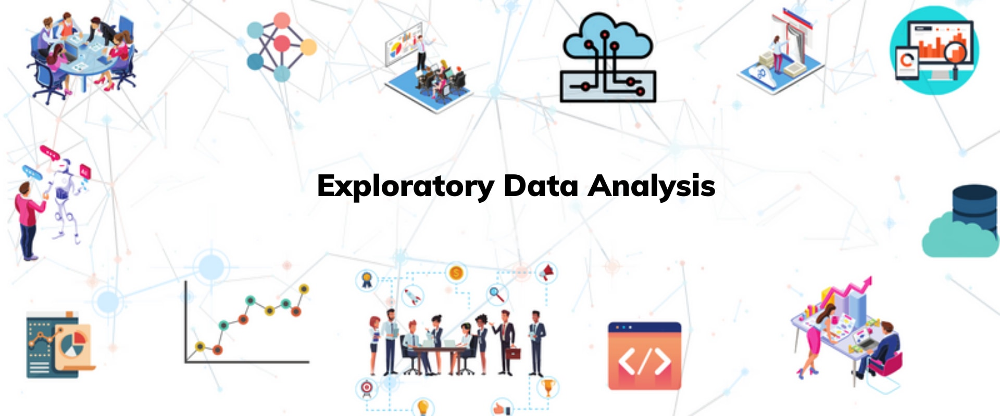

In [4]:
# Make a copy of data
df=data.copy()

In [5]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [6]:
# strip() function removes specific characters from the start and end of a string
df.columns = df.columns.str.strip()

In [7]:
# UpperCase all first letter of the column

newlist = []
for i in df:
    if len(i)!=3:
        newlist.append(i.title())
    else:
         newlist.append(i)
df.columns=newlist        

In [8]:
df.rename(columns={'Thinness  1-19 Years': 'Thinness 1-19 Years'}, inplace=True)

In [9]:
df.columns

Index(['Country', 'Year', 'Status', 'Life Expectancy', 'Adult Mortality',
       'Infant Deaths', 'Alcohol', 'Percentage Expenditure', 'Hepatitis B',
       'Measles', 'BMI', 'Under-Five Deaths', 'Polio', 'Total Expenditure',
       'Diphtheria', 'Hiv/Aids', 'GDP', 'Population', 'Thinness 1-19 Years',
       'Thinness 5-9 Years', 'Income Composition Of Resources', 'Schooling'],
      dtype='object')

In [10]:
df.head(10)

,Country,Year,Status,Life Expectancy,Adult Mortality,Infant Deaths,Alcohol,Percentage Expenditure,Hepatitis B,Measles,...,Polio,Total Expenditure,Diphtheria,Hiv/Aids,GDP,Population,Thinness 1-19 Years,Thinness 5-9 Years,Income Composition Of Resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.26,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.70,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.74,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.96,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.54,2978599.0,18.2,18.2,0.454,9.5
5,Afghanistan,2010,Developing,58.8,279.0,74,0.01,79.679367,66.0,1989,...,66.0,9.20,66.0,0.1,553.33,2883167.0,18.4,18.4,0.448,9.2
6,Afghanistan,2009,Developing,58.6,281.0,77,0.01,56.762217,63.0,2861,...,63.0,9.42,63.0,0.1,445.89,284331.0,18.6,18.7,0.434,8.9
7,Afghanistan,2008,Developing,58.1,287.0,80,0.03,25.873925,64.0,1599,...,64.0,8.33,64.0,0.1,373.36,2729431.0,18.8,18.9,0.433,8.7
8,Afghanistan,2007,Developing,57.5,295.0,82,0.02,10.910156,63.0,1141,...,63.0,6.73,63.0,0.1,369.84,26616792.0,19.0,19.1,0.415,8.4
9,Afghanistan,2006,Developing,57.3,295.0,84,0.03,17.171518,64.0,1990,...,58.0,7.43,58.0,0.1,272.56,2589345.0,19.2,19.3,0.405,8.1


In [172]:
df.tail(10)

,Country,Year,Status,Life Expectancy,Adult Mortality,Infant Deaths,Alcohol,Percentage Expenditure,Hepatitis B,Measles,...,Polio,Total Expenditure,Diphtheria,Hiv/Aids,GDP,Population,Thinness 1-19 Years,Thinness 5-9 Years,Income Composition Of Resources,Schooling
2761,Zimbabwe,2009,Developing,50.0,587.0,30,4.64,1.040021,73.0,853,...,69.0,6.26,73.0,18.1,65.82,1381599.0,7.5,7.4,0.419,9.9
2762,Zimbabwe,2008,Developing,48.2,632.0,30,3.56,20.843429,75.0,0,...,75.0,4.96,75.0,20.5,325.68,13558469.0,7.8,7.8,0.421,9.7
2763,Zimbabwe,2007,Developing,46.6,67.0,29,3.88,29.814566,72.0,242,...,73.0,4.47,73.0,23.7,397.00,1332999.0,8.2,8.2,0.414,9.6
2764,Zimbabwe,2006,Developing,45.4,7.0,28,4.57,34.262169,68.0,212,...,71.0,5.12,7.0,26.8,414.80,13124267.0,8.6,8.6,0.408,9.5
2765,Zimbabwe,2005,Developing,44.6,717.0,28,4.14,8.717409,65.0,420,...,69.0,6.44,68.0,30.3,444.77,129432.0,9.0,9.0,0.406,9.3
2766,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,...,67.0,7.13,65.0,33.6,454.37,12777511.0,9.4,9.4,0.407,9.2
2767,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,...,7.0,6.52,68.0,36.7,453.35,12633897.0,9.8,9.9,0.418,9.5
2768,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,...,73.0,6.53,71.0,39.8,57.35,125525.0,1.2,1.3,0.427,10.0
2769,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,...,76.0,6.16,75.0,42.1,548.59,12366165.0,1.6,1.7,0.427,9.8
2770,Zimbabwe,2000,Developing,46.0,665.0,24,1.68,0.000000,79.0,1483,...,78.0,7.10,78.0,43.5,547.36,12222251.0,11.0,11.2,0.434,9.8


In [11]:
## Drop columns which are not significant
df.drop(["Percentage Expenditure"],axis=1,inplace=True)

In [12]:
# Grouped my Target Variable so converted to Categorical Column

df['Life Expectancy'].fillna(0,inplace=True)
bins = [35,45,55,65,75,85,90]
labels = ['35-45','45-55','55-65','65-75','75-85','85-90']
df['Life Expectancy'] = pd.cut(df['Life Expectancy'], bins=bins, labels=labels)
df.head()


,Country,Year,Status,Life Expectancy,Adult Mortality,Infant Deaths,Alcohol,Hepatitis B,Measles,BMI,...,Polio,Total Expenditure,Diphtheria,Hiv/Aids,GDP,Population,Thinness 1-19 Years,Thinness 5-9 Years,Income Composition Of Resources,Schooling
0,Afghanistan,2015,Developing,55-65,263.0,62,0.01,65.0,1154,19.1,...,6.0,8.16,65.0,0.1,584.26,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,55-65,271.0,64,0.01,62.0,492,18.6,...,58.0,8.18,62.0,0.1,612.70,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,55-65,268.0,66,0.01,64.0,430,18.1,...,62.0,8.13,64.0,0.1,631.74,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,55-65,272.0,69,0.01,67.0,2787,17.6,...,67.0,8.52,67.0,0.1,669.96,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,55-65,275.0,71,0.01,68.0,3013,17.2,...,68.0,7.87,68.0,0.1,63.54,2978599.0,18.2,18.2,0.454,9.5


# UNIVARIATE ANAYSIS

# Going through columns one by one


As we have Missing Values in below variables will handle them during the Analysis paralel.

Adult Mortality

Alcohol

Hepatitis B 

BMI

Polio

Total expenditure

Diphtheria 

GDP

Thinness  1-19 years

Thinness 5-9 years

Income composition of resources

Schooling


The below output prints the IQR scores, which can be used to detect outliers

The interquartile range (IQR) is a measure of statistical dispersion and is calculated as 
the difference between the 75th and 25th percentiles. 
It is represented by the formula IQR = Q3 − Q1. 
The lines of code below calculate and print the interquartile range for each of the variables in the dataset.

In [21]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

Year                               8.000000e+00
Adult Mortality                    1.540000e+02
Infant Deaths                      2.000000e+01
Alcohol                            6.730000e+00
Hepatitis B                        2.300000e+01
Measles                            3.365000e+02
BMI                                3.677500e+01
Under-Five Deaths                  2.500000e+01
Polio                              1.900000e+01
Total Expenditure                  3.242500e+00
Diphtheria                         1.900000e+01
Hiv/Aids                           7.000000e-01
GDP                                5.801792e+03
Population                         8.251084e+06
Thinness 1-19 Years                5.500000e+00
Thinness 5-9 Years                 5.700000e+00
Income Composition Of Resources    2.880000e-01
Schooling                          4.200000e+00
dtype: float64


Identifying Outliers with Skewness
Several machine learning algorithms make the assumption that the data follow a normal (or Gaussian) distribution. This is easy to check with the skewness value, which explains the extent to which the data is normally distributed. Ideally, the skewness value should be between -1 and +1, and any major deviation from this range indicates the presence of extreme values.

The first line of code below prints the skewness value for the 'Income' variable, while the second line prints the summary statistics.

In [22]:
print(df['Alcohol'].skew())
df['Alcohol'].describe()

0.5963077038568991


count    2588.000000
mean        4.586654
std         4.042118
min         0.010000
25%         0.870000
50%         3.780000
75%         7.600000
max        17.870000
Name: Alcohol, dtype: float64

### Visualization on Target Variable: Life Expectancy

In [23]:
# Finding the Frequency

Life_exp=df['Life Expectancy'].value_counts()
Life_exp

65-75    1173
75-85     741
55-65     523
45-55     273
85-90      42
35-45      19
Name: Life Expectancy, dtype: int64

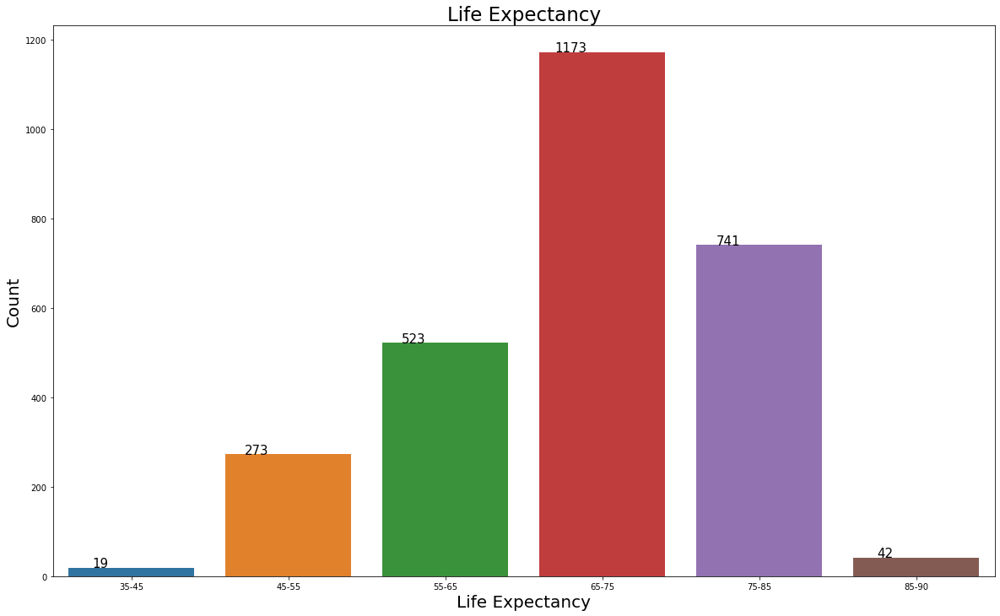

In [24]:
#countplot

plt.figure(figsize = (20,12))
ax=sns.countplot(df['Life Expectancy'])
ax.set_title("Life Expectancy", fontsize = 23)
plt.xlabel("Life Expectancy",fontsize=20)
plt.ylabel("Count", fontsize=20)
for p in ax.patches:
    ax.annotate(f'\n{p.get_height()}', (p.get_x()+0.2, p.get_height()), color='black', size=15, ha="center")

### Drop Missing Value from Life Expectancy

In [13]:
df=df.dropna(subset= ['Life Expectancy'])

In [14]:
# Finding the Frequency

Life_exp=df['Life Expectancy'].value_counts()
Life_exp

65-75    1173
75-85     741
55-65     523
45-55     273
85-90      42
35-45      19
Name: Life Expectancy, dtype: int64

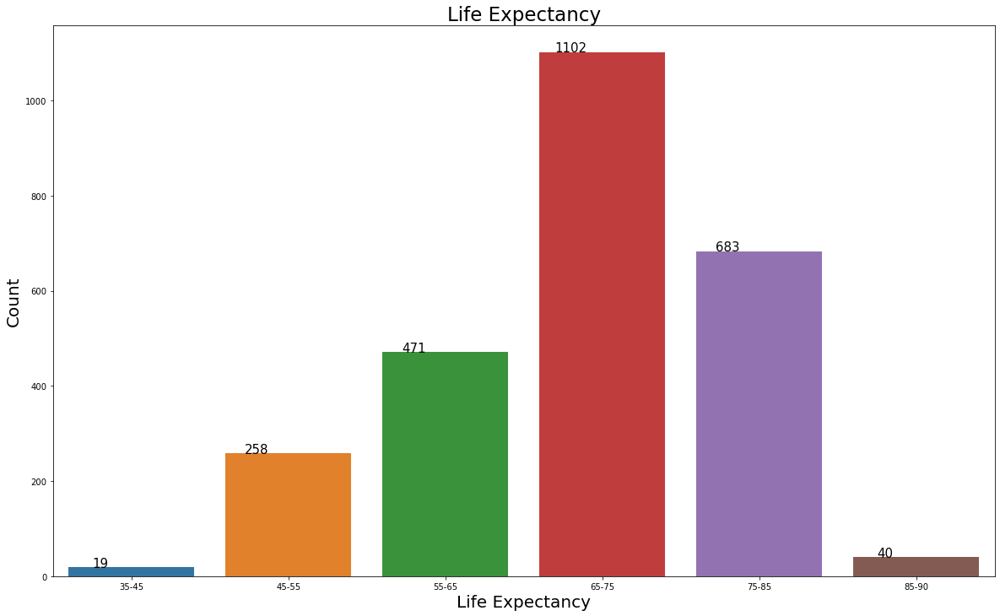

In [30]:
#countplot

plt.figure(figsize = (20,12))
ax=sns.countplot(df['Life Expectancy'])
ax.set_title("Life Expectancy", fontsize = 23)
plt.xlabel("Life Expectancy",fontsize=20)
plt.ylabel("Count", fontsize=20)
for p in ax.patches:
    ax.annotate(f'\n{p.get_height()}', (p.get_x()+0.2, p.get_height()), color='black', size=15, ha="center")

from above Analysis we can see that life expectancy is more Between 65-75


### Visualization on Input Variable - Status

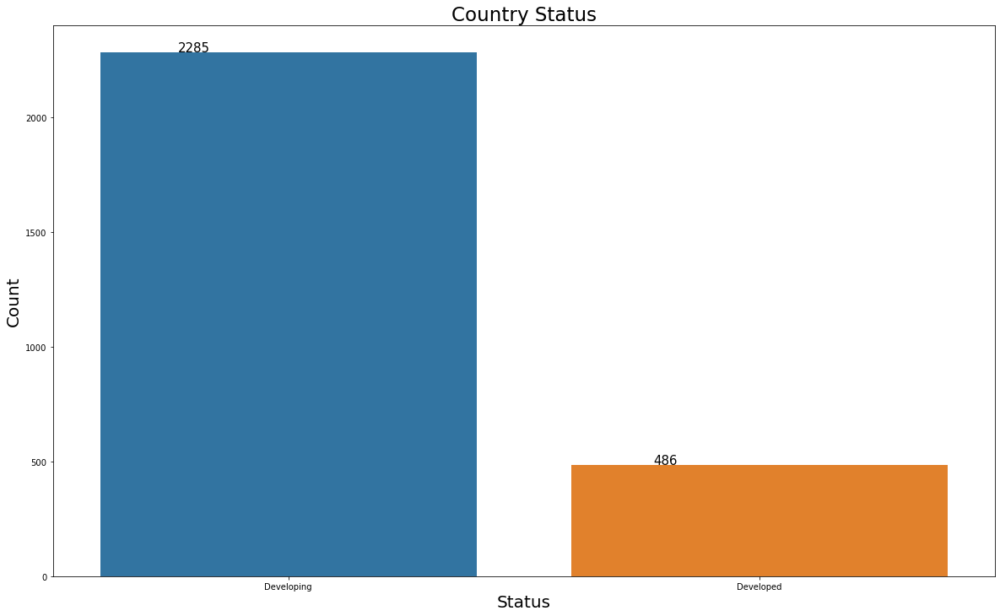

In [54]:
#countplot

plt.figure(figsize = (20,12))
ax=sns.countplot(df['Status'])
ax.set_title("Country Status", fontsize = 23)
plt.xlabel("Status",fontsize=20)
plt.ylabel("Count", fontsize=20)
for p in ax.patches:
    ax.annotate(f'\n{p.get_height()}', (p.get_x()+0.2, p.get_height()), color='black', size=15, ha="center")

Country Status more in Developing than Developed

### ### Visualization on Input Variable - Year

<AxesSubplot:ylabel='Year'>

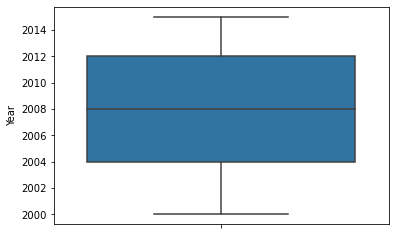

In [55]:
sns.boxplot( y=df['Year'] )

<AxesSubplot:xlabel='Year', ylabel='Density'>

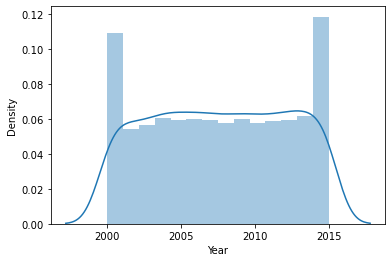

In [56]:
sns.distplot(df['Year'])

### Created Def function

In [21]:
#lower inner fence: Q1 - 1.5*IQR
#upper inner fence: Q3 + 1.5*IQR
def outlier_analysis(col):
    Q1=df[col].quantile(0.25)
    Q3=df[col].quantile(0.75)
    IQR=Q3-Q1
    UIF=Q3+1.5*(IQR)
    LIF=Q1-1.5*(IQR)
    df_out =df[(df[col]<LIF) | (df[col]>UIF)] # I created a new data set that has just include potential outliers
    sns.distplot(df_out[col])#Plotting univariate distributions.By default, this will draw a histogram and fit a kernel density estimate (KDE)
   
    return df_out[col] .describe()

### Visualization on Input Variable - Adult Mortality

<AxesSubplot:ylabel='Adult Mortality'>

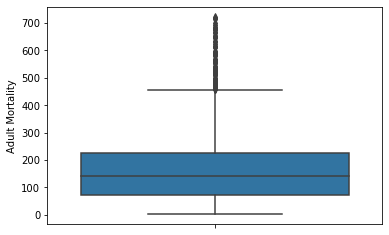

In [58]:
sns.boxplot( y=df['Adult Mortality'] )

count     82.000000
mean     555.365854
std       76.333497
min      459.000000
25%      488.000000
50%      534.500000
75%      612.500000
max      723.000000
Name: Adult Mortality, dtype: float64

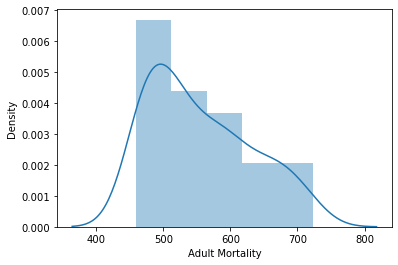

In [59]:
outlier_analysis('Adult Mortality')

### Drop Missing Value from Adult Mortality

In [15]:
df=df.dropna(subset= ['Adult Mortality'])

<AxesSubplot:ylabel='Adult Mortality'>

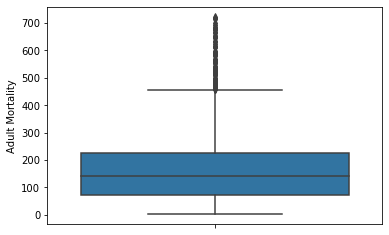

In [32]:
sns.boxplot( y=df['Adult Mortality'] )

<AxesSubplot:xlabel='Adult Mortality', ylabel='Density'>

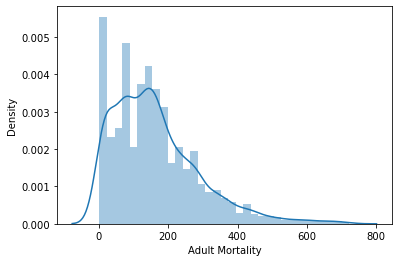

In [33]:
sns.distplot(df['Adult Mortality'])

### Visualization on Input Variable - Infant Deaths

<AxesSubplot:ylabel='Infant Deaths'>

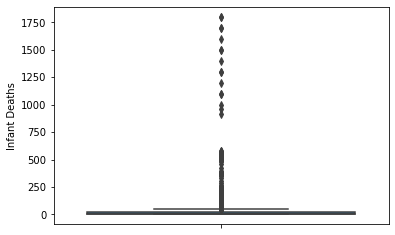

In [60]:
sns.boxplot( y=df['Infant Deaths'] )

count     334.000000
mean      196.296407
std       298.297872
min        51.000000
25%        60.000000
50%        80.000000
75%       185.000000
max      1800.000000
Name: Infant Deaths, dtype: float64

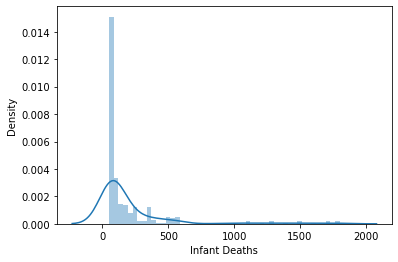

In [61]:
outlier_analysis('Infant Deaths')

### Visualization on Input Variable - Alcohol

<AxesSubplot:ylabel='Alcohol'>

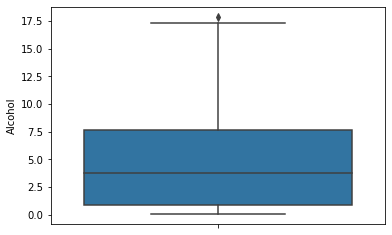

In [14]:
sns.boxplot( y=df['Alcohol'] )

<AxesSubplot:xlabel='Alcohol', ylabel='Density'>

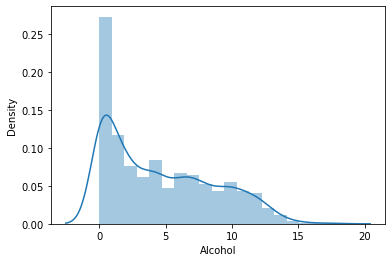

In [27]:
sns.distplot(df['Alcohol'])

### Drop Missing Value from Alcohol

In [16]:
df=df.dropna(subset= ['Alcohol'])

### Removing the Outlier as it is small

In [ ]:
#lower inner fence: Q1 - 1.5*IQR
#upper inner fence: Q3 + 1.5*IQR
def outlier_analysis(col):
    Q1=df[col].quantile(0.25)
    Q3=df[col].quantile(0.75)
    IQR=Q3-Q1
    UIF=Q3+1.5*(IQR)#UIF=upper inner fence
    LIF=Q1-1.5*(IQR) #LIF=lower inner fence
    data_out =df[(df[col]<LIF) | (df[col]>UIF)] # I created a new data set that has just include potential outliers 
    return data_out[col] .describe(),data_out[col],len(data_out)

<AxesSubplot:ylabel='Alcohol'>

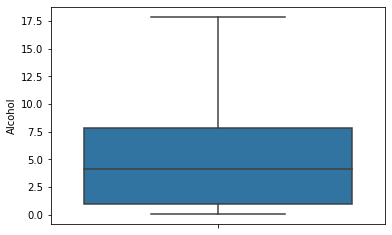

In [129]:
sns.boxplot( y=df['Alcohol'] )

<AxesSubplot:xlabel='Alcohol', ylabel='Density'>

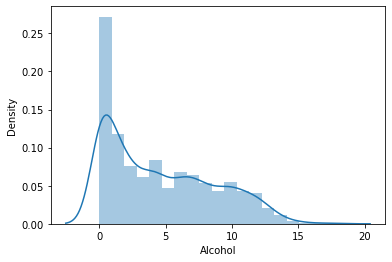

In [36]:
sns.distplot(df['Alcohol'])

### Visualization on Input Variable - Hepatitis B

<AxesSubplot:ylabel='Hepatitis B'>

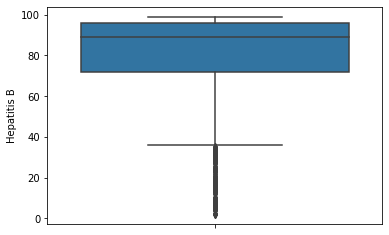

In [70]:
sns.boxplot( y=df['Hepatitis B'] )

count    211.000000
mean      14.838863
std        8.910273
min        2.000000
25%        8.000000
50%       10.000000
75%       19.000000
max       35.000000
Name: Hepatitis B, dtype: float64

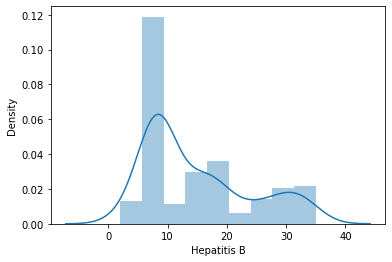

In [71]:
outlier_analysis('Hepatitis B')

### Drop Missing Value from Hepatitis B

In [17]:
df=df.dropna(subset= ['Hepatitis B'])

<AxesSubplot:ylabel='Hepatitis B'>

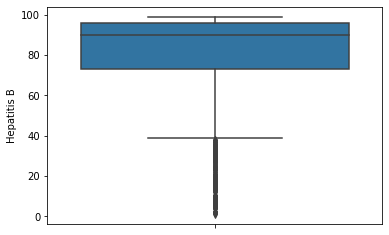

In [38]:
sns.boxplot( y=df['Hepatitis B'] )

<AxesSubplot:xlabel='Hepatitis B', ylabel='Density'>

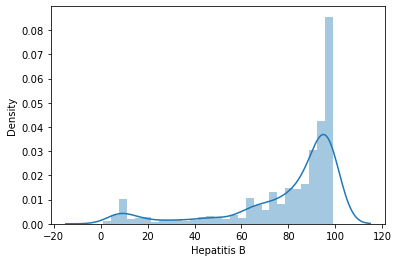

In [39]:
sns.distplot(df['Hepatitis B'])

### Visualization on Input Variable - Measles

<AxesSubplot:ylabel='Measles'>

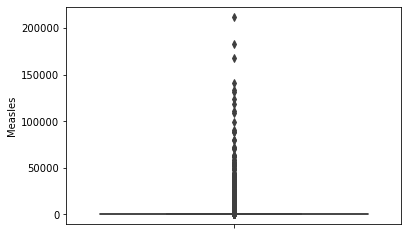

In [72]:
sns.boxplot( y=df['Measles'] )

count       509.000000
mean      12625.141454
std       24614.705156
min         843.000000
25%        1613.000000
50%        3893.000000
75%       10795.000000
max      212183.000000
Name: Measles, dtype: float64

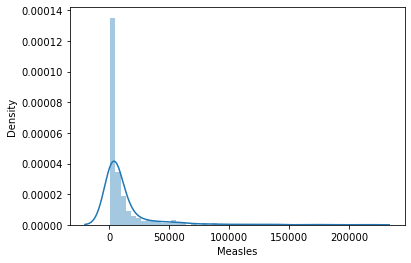

In [89]:
outlier_analysis('Measles')

### Visualization on Input Variable - BMI

<AxesSubplot:ylabel='BMI'>

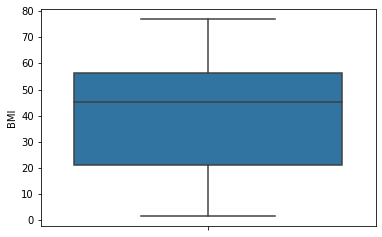

In [51]:
sns.boxplot( y=df['BMI'] )

<AxesSubplot:xlabel='BMI', ylabel='Density'>

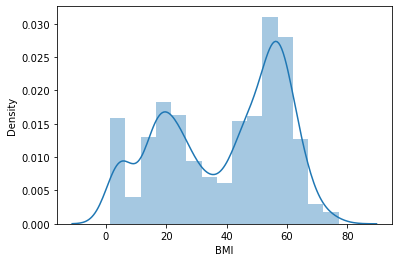

In [52]:
sns.distplot(df['BMI'])

### Drop Missing Value from BMI

In [18]:
df=df.dropna(subset= ['BMI'])

<AxesSubplot:ylabel='BMI'>

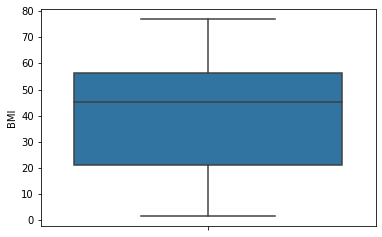

In [54]:
sns.boxplot( y=df['BMI'] )

<AxesSubplot:xlabel='BMI', ylabel='Density'>

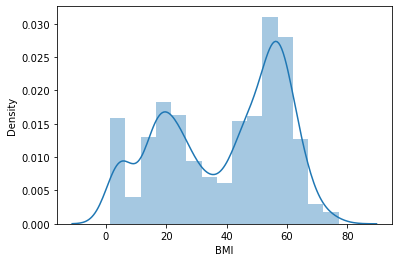

In [55]:
sns.distplot(df['BMI'])

### Visualization on Input Variable - Under-Five Deaths

<AxesSubplot:ylabel='Under-Five Deaths'>

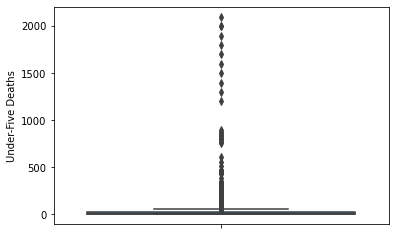

In [56]:
sns.boxplot( y=df['Under-Five Deaths'] )

count     332.000000
mean      210.331325
std       318.578753
min        56.000000
25%        79.000000
50%        97.000000
75%       175.750000
max      2100.000000
Name: Under-Five Deaths, dtype: float64

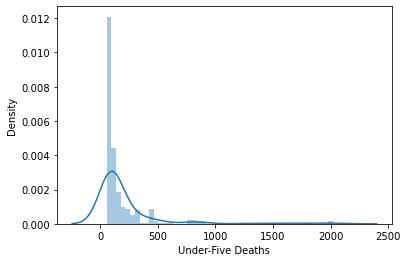

In [57]:
outlier_analysis('Under-Five Deaths')

### Visualization on Input Variable - Polio

<AxesSubplot:ylabel='Polio'>

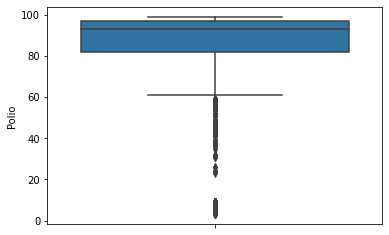

In [58]:
sns.boxplot( y=df['Polio'] )

count    238.000000
mean      25.970588
std       20.660282
min        3.000000
25%        8.000000
50%        9.000000
75%       47.000000
max       59.000000
Name: Polio, dtype: float64

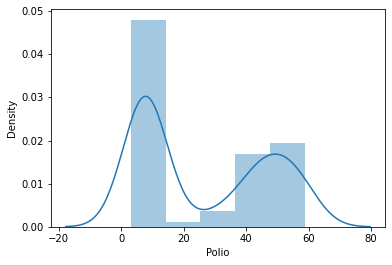

In [59]:
outlier_analysis('Polio')

### Drop Missing Value from Polio

In [19]:
df=df.dropna(subset= ['Polio'])

<AxesSubplot:ylabel='Polio'>

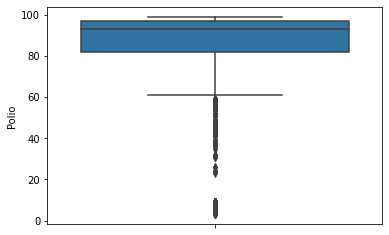

In [61]:
sns.boxplot( y=df['Polio'] )

<AxesSubplot:xlabel='Polio', ylabel='Density'>

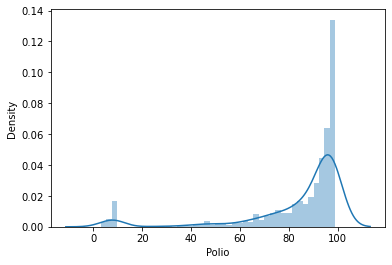

In [62]:
sns.distplot(df['Polio'])

### Visualization on Input Variable - Total expenditure

<AxesSubplot:ylabel='Total Expenditure'>

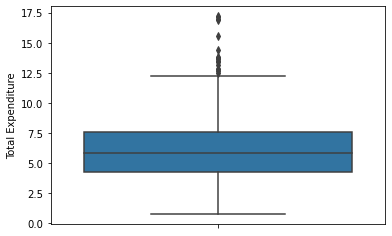

In [63]:
sns.boxplot( y=df['Total Expenditure'] )

count    18.000000
mean     14.305556
std       1.670735
min      12.490000
25%      13.192500
50%      13.720000
75%      15.275000
max      17.200000
Name: Total Expenditure, dtype: float64

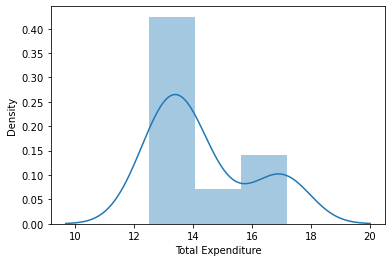

In [64]:
outlier_analysis('Total Expenditure')

### Drop Missing Value from Total Expenditure

In [20]:
df=df.dropna(subset= ['Total Expenditure'])

<AxesSubplot:ylabel='Total Expenditure'>

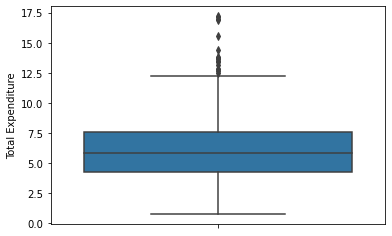

In [66]:
sns.boxplot( y=df['Total Expenditure'] )

<AxesSubplot:xlabel='Total Expenditure', ylabel='Density'>

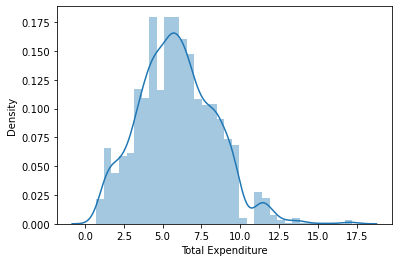

In [67]:
sns.distplot(df['Total Expenditure'])

### Visualization on Input Variable - Diphtheria

<AxesSubplot:ylabel='Diphtheria'>

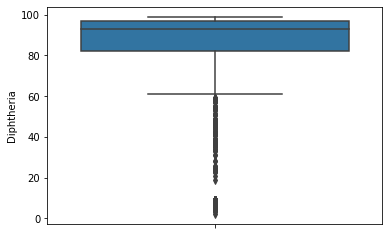

In [68]:
sns.boxplot( y=df['Diphtheria'] )

count    224.000000
mean      23.508929
std       18.880315
min        2.000000
25%        8.000000
50%        9.000000
75%       42.000000
max       59.000000
Name: Diphtheria, dtype: float64

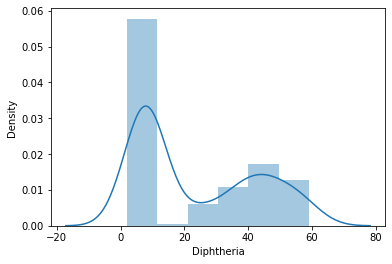

In [69]:
outlier_analysis('Diphtheria')

### Drop Missing Value from Diphtheria

In [21]:
df=df.dropna(subset= ['Diphtheria'])

<AxesSubplot:ylabel='Diphtheria'>

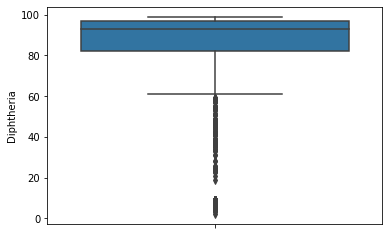

In [71]:
sns.boxplot( y=df['Diphtheria'] )

<AxesSubplot:xlabel='Diphtheria', ylabel='Density'>

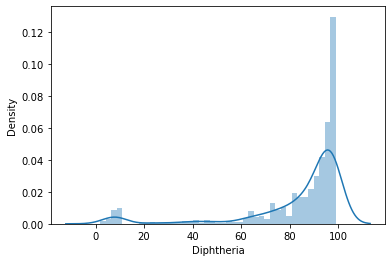

In [72]:
sns.distplot(df['Diphtheria'])

### Visualization on Input Variable -  HIV/AIDS

<AxesSubplot:ylabel='Hiv/Aids'>

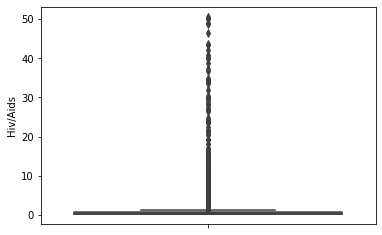

In [73]:
sns.boxplot( y=df['Hiv/Aids'] )

count    448.000000
mean       7.952009
std        9.655016
min        1.400000
25%        2.300000
50%        4.400000
75%        8.525000
max       50.600000
Name: Hiv/Aids, dtype: float64

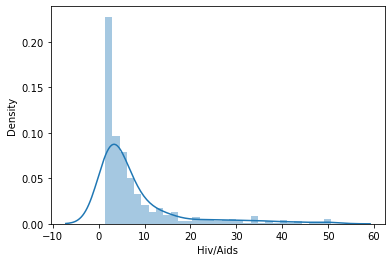

In [74]:
outlier_analysis('Hiv/Aids')

### Visualization on Input Variable - GDP

<AxesSubplot:ylabel='GDP'>

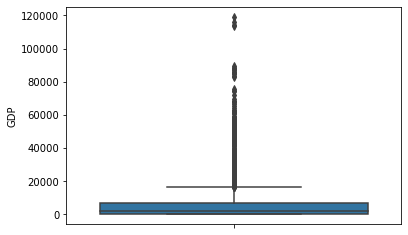

In [75]:
sns.boxplot( y=df['GDP'] )

count       293.000000
mean      39591.713140
std       18880.002299
min       16523.320000
25%       24517.270000
50%       36393.670000
75%       48399.960000
max      119172.740000
Name: GDP, dtype: float64

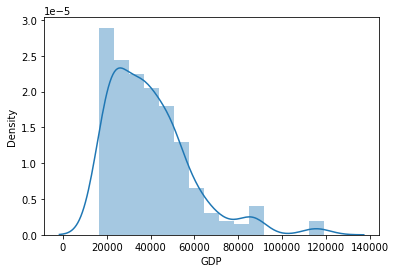

In [76]:
outlier_analysis('GDP')

### Drop Missing Value from GDP

In [22]:
df=df.dropna(subset= ['GDP'])

<AxesSubplot:ylabel='GDP'>

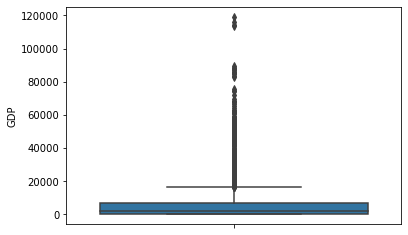

In [78]:
sns.boxplot( y=df['GDP'] )

<AxesSubplot:xlabel='GDP', ylabel='Density'>

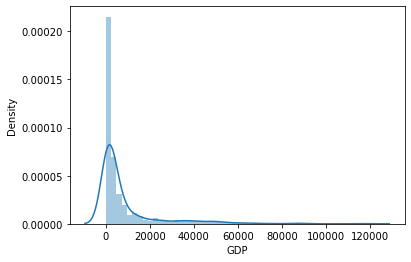

In [79]:
sns.distplot(df['GDP'])

### Visualization on Input Variable - Population

<AxesSubplot:ylabel='Population'>

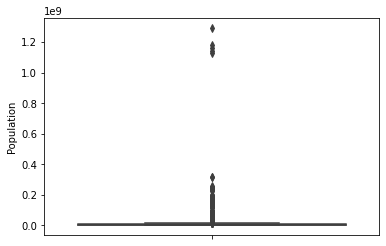

In [80]:
sns.boxplot( y=df['Population'] )

count    2.780000e+02
mean     7.971004e+07
std      1.589787e+08
min      1.773163e+07
25%      2.624770e+07
50%      3.914695e+07
75%      6.827357e+07
max      1.293859e+09
Name: Population, dtype: float64

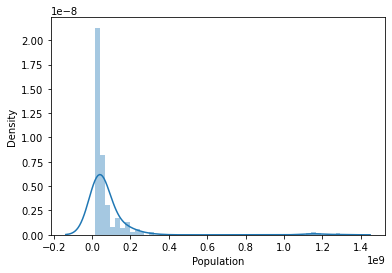

In [81]:
outlier_analysis('Population')

### Visualization on Input Variable -  Thinness  1-19 years

<AxesSubplot:ylabel='Thinness 1-19 Years'>

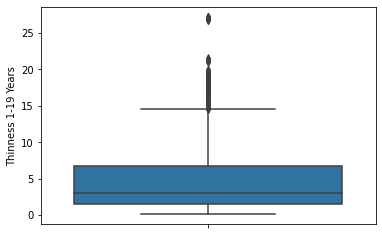

In [85]:
sns.boxplot( y=df['Thinness 1-19 Years'] )

count    87.000000
mean     18.733333
std       3.585749
min      14.600000
25%      16.200000
50%      18.000000
75%      19.500000
max      27.200000
Name: Thinness 1-19 Years, dtype: float64

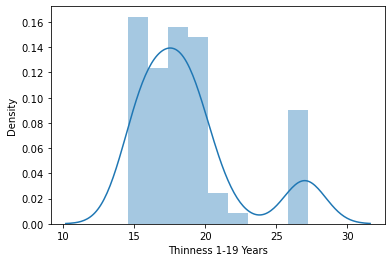

In [86]:
outlier_analysis('Thinness 1-19 Years')

### Drop Missing Value from Thinness 1-19 Years

In [23]:
df=df.dropna(subset= ['Thinness 1-19 Years'])

<AxesSubplot:ylabel='Thinness 1-19 Years'>

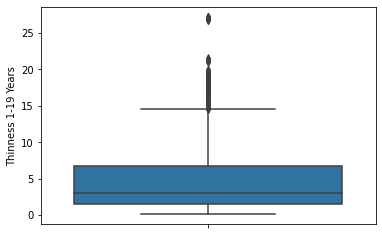

In [88]:
sns.boxplot( y=df['Thinness 1-19 Years'] )

<AxesSubplot:xlabel='Thinness 1-19 Years', ylabel='Density'>

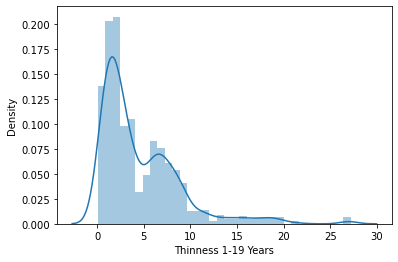

In [89]:
sns.distplot(df['Thinness 1-19 Years'])

### Visualization on Input Variable -  Thinness  5-9 years

<AxesSubplot:ylabel='Thinness 5-9 Years'>

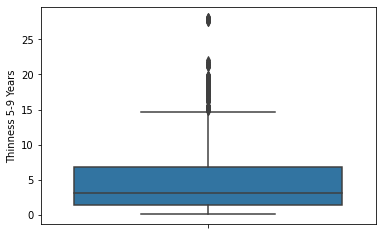

In [90]:
sns.boxplot( y=df['Thinness 5-9 Years'] )

count    87.000000
mean     19.258621
std       3.752288
min      14.800000
25%      16.800000
50%      18.400000
75%      19.900000
max      28.200000
Name: Thinness 5-9 Years, dtype: float64

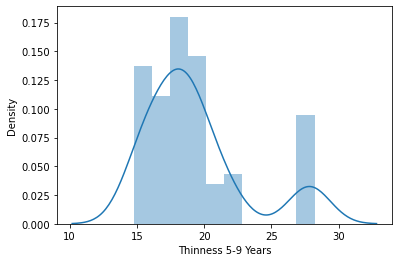

In [91]:
outlier_analysis('Thinness 5-9 Years')

### Drop Missing Value from Thinness 5-9 Years

In [24]:
df=df.dropna(subset= ['Thinness 5-9 Years'])

<AxesSubplot:ylabel='Thinness 5-9 Years'>

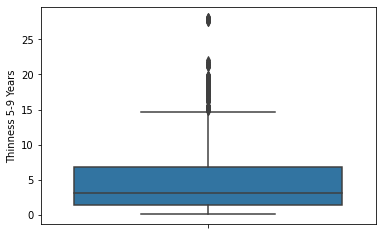

In [93]:
sns.boxplot( y=df['Thinness 5-9 Years'] )

<AxesSubplot:xlabel='Thinness 5-9 Years', ylabel='Density'>

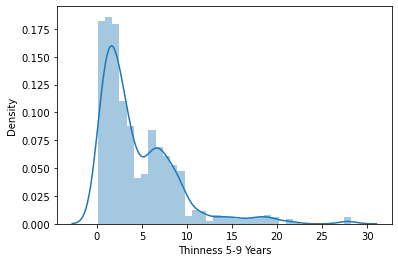

In [94]:
sns.distplot(df['Thinness 5-9 Years'])

### Visualization on Input Variable - Income Composition of Resources

<AxesSubplot:ylabel='Income Composition Of Resources'>

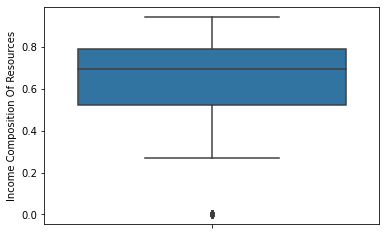

In [95]:
sns.boxplot( y=df['Income Composition Of Resources'] )

count    81.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Income Composition Of Resources, dtype: float64

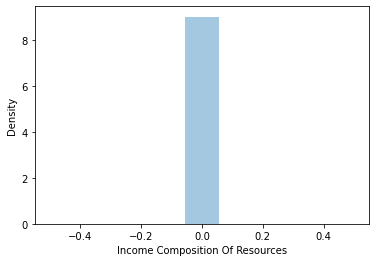

In [96]:
outlier_analysis('Income Composition Of Resources')

### Drop Missing Value from Income Composition Of Resources

In [25]:
df=df.dropna(subset= ['Income Composition Of Resources'])

<AxesSubplot:ylabel='Income Composition Of Resources'>

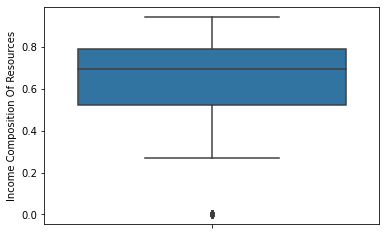

In [100]:
sns.boxplot( y=df['Income Composition Of Resources'] )

<AxesSubplot:xlabel='Income Composition Of Resources', ylabel='Density'>

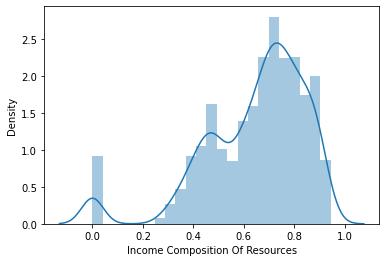

In [101]:
sns.distplot(df['Income Composition Of Resources'])

### Visualization on Input Variable - Schooling

<AxesSubplot:ylabel='Schooling'>

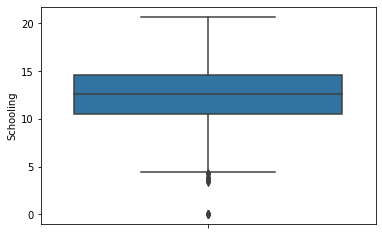

In [102]:
sns.boxplot( y=df['Schooling'] )

count    15.000000
mean      1.780000
std       1.982495
min       0.000000
25%       0.000000
50%       0.000000
75%       3.700000
max       4.300000
Name: Schooling, dtype: float64

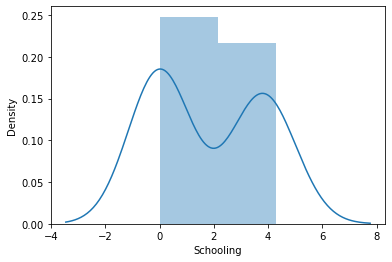

In [103]:
outlier_analysis('Schooling')

### Drop Missing Value from Schooling

In [26]:
df=df.dropna(subset= ['Schooling'])

<AxesSubplot:ylabel='Schooling'>

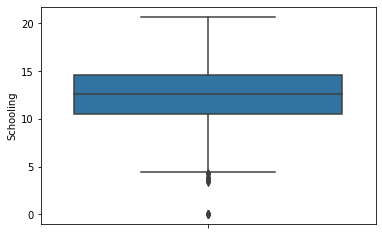

In [105]:
sns.boxplot( y=df['Schooling'] )

<AxesSubplot:xlabel='Schooling', ylabel='Density'>

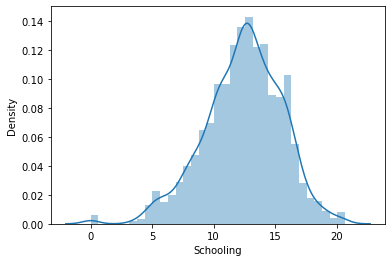

In [106]:
sns.distplot(df['Schooling'])

In [27]:
#calculatin no. of missing values for each column and it's percentage
def percentage_of_miss():
  df1=df[df.columns[df.isnull().sum()>=0]] # I did slicing by condition( I get s subset of dataframe that contains columns that have atleast one missing values) )
  total_miss = df1.isnull().sum().sort_values(ascending=False)
  percent_miss = ((df1.isnull().sum()/df1.isnull().count())*100).sort_values(ascending=False) #df1.isnull().sum() returns only number of missing values,df1.isnull().count() returns whole number of observations (True=1 for null and False=0 for not missing ) 
  missing_data = pd.concat([total_miss, percent_miss], axis=1, keys=['Number of Missing', 'Percentage'])
  return(missing_data)
percentage_of_miss()

,Number of Missing,Percentage
Country,0,0.0
Polio,0,0.0
Income Composition Of Resources,0,0.0
Thinness 5-9 Years,0,0.0
Thinness 1-19 Years,0,0.0
Population,0,0.0
GDP,0,0.0
Hiv/Aids,0,0.0
Diphtheria,0,0.0
Total Expenditure,0,0.0


### Visualization on Target Variable - Life Expectancy and Input Variable - Year

<AxesSubplot:xlabel='Life Expectancy', ylabel='Year'>

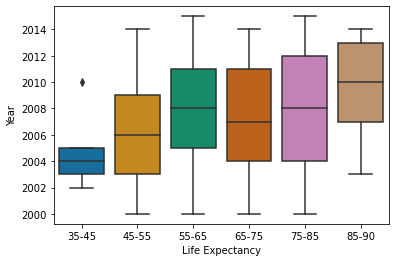

In [136]:
sns.boxplot(y='Year', x='Life Expectancy', 
                 data=df, 
                 palette="colorblind",)

###  Chi-squared test of independence for Categorical Variable
### Life Expectancy and Input Variable - Country

In [40]:
from scipy.stats import chi2_contingency
def chi_square(c1,c2):
    chi_2, p_val, dof, exp_val = chi2_contingency(pd.crosstab(df[c1],df[c2],margins = False))# make sure margins = False

    print(exp_val)
    #print('\nChi-square is : %f'%chi_2, '\n\np_value is : %f'%p_val, '\n\ndegree of freedom is : %i'%dof)
    print(f'\nChi-square is : {chi_2}', f'\n\np_value is : {p_val}', f'\n\ndegree of freedom is :{dof}')

    if p_val < 0.05:# consider significan level is 5%
        print("\nThere is some correlation between the two variables at 0.05 significant level")
    else:
        print("\nThere is no correlation between the two variables")

In [43]:
chi_square("Life Expectancy",'Country')

[[0.10970769 0.10970769 0.10970769 ... 0.06171057 0.10970769 0.10970769]
 [1.57632624 1.57632624 1.57632624 ... 0.88668351 1.57632624 1.57632624]
 [3.01984843 3.01984843 3.01984843 ... 1.69866474 3.01984843 3.01984843]
 [6.77300613 6.77300613 6.77300613 ... 3.80981595 6.77300613 6.77300613]
 [4.27859978 4.27859978 4.27859978 ... 2.40671238 4.27859978 4.27859978]
 [0.24251173 0.24251173 0.24251173 ... 0.13641285 0.24251173 0.24251173]]

Chi-square is : 6329.0758219613945 

p_value is : 0.0 

degree of freedom is :925

There is some correlation between the two variables at 0.05 significant level


# BIVARIATE ANAYSIS

### Visualization on  Categorical variable -  Target Variable - Life Expectancy and Input Variable - Status

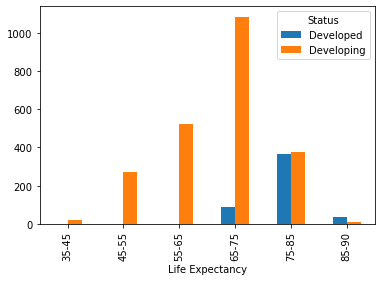

In [34]:
df1 = pd.crosstab(df['Status'], df['Life Expectancy'])
df1.T.plot.bar()

plt.show()

## Chi-squared test of independence

In [41]:
chi_square("Status",'Life Expectancy')

[[  3.33237099  47.88090942  91.72789607 205.73006135 129.96246842
    7.36629376]
 [ 15.66762901 225.11909058 431.27210393 967.26993865 611.03753158
   34.63370624]]

Chi-square is : 888.6913437987739 

p_value is : 7.456535867689468e-190 

degree of freedom is :5

There is some correlation between the two variables at 0.05 significant level


### Visualization on Target Variable - Life Expectancy and Input Variable Alcohol

<AxesSubplot:xlabel='Life Expectancy', ylabel='Alcohol'>

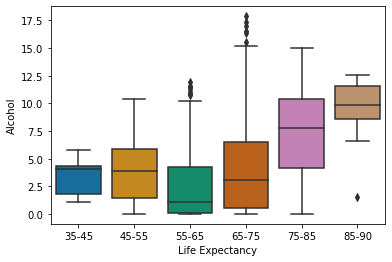

In [148]:
sns.boxplot(y='Alcohol', x='Life Expectancy', 
                 data=df, 
                 palette="colorblind",)

### Visualization on Target Variable - Life Expectancy and Input Variable - Adult Mortality

<AxesSubplot:xlabel='Life Expectancy', ylabel='Adult Mortality'>

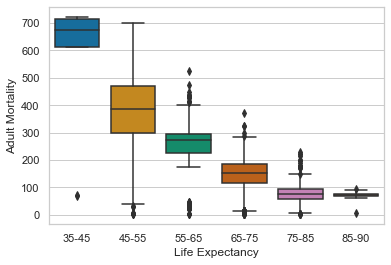

In [163]:
sns.boxplot(y='Adult Mortality', x='Life Expectancy', 
                 data=df, 
                 palette="colorblind",)

### Visualization on Target Variable - Life Expectancy and Input Variable - BMI

<AxesSubplot:xlabel='Life Expectancy', ylabel='BMI'>

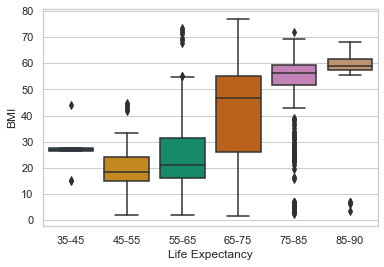

In [164]:
sns.boxplot(y='BMI', x='Life Expectancy', 
                 data=df, 
                 palette="colorblind",)

### Visualization on Target Variable - Life Expectancy and Input Variable - Population

<AxesSubplot:xlabel='Life Expectancy', ylabel='Population'>

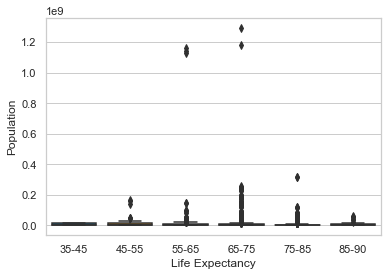

In [165]:
sns.boxplot(y='Population', x='Life Expectancy', 
                 data=df, 
                 palette="colorblind",)

### Visualization on Target Variable - Life Expectancy and Input Variable - Hepatitis B

<AxesSubplot:xlabel='Life Expectancy', ylabel='Hepatitis B'>

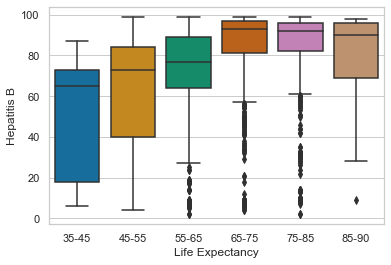

In [167]:
sns.boxplot(y='Hepatitis B', x='Life Expectancy', 
                 data=df, 
                 palette="colorblind",)

### Visualization on Target Variable - Life Expectancy and Input Variable - Measles

<AxesSubplot:xlabel='Life Expectancy', ylabel='Measles'>

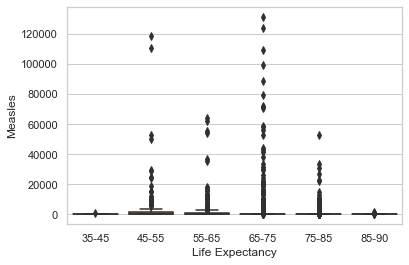

In [168]:
sns.boxplot(y='Measles', x='Life Expectancy', 
                 data=df, 
                 palette="colorblind",)

### Visualization on Target Variable - Life Expectancy and Input Variable - Polio

<AxesSubplot:xlabel='Life Expectancy', ylabel='Polio'>

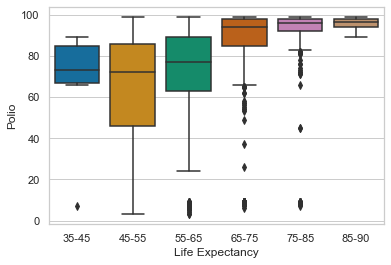

In [169]:
sns.boxplot(y='Polio', x='Life Expectancy', 
                 data=df, 
                 palette="colorblind",)

### Visualization on Target Variable - Life Expectancy and Input Variable - Income composition of resources

<AxesSubplot:xlabel='Life Expectancy', ylabel='Income Composition Of Resources'>

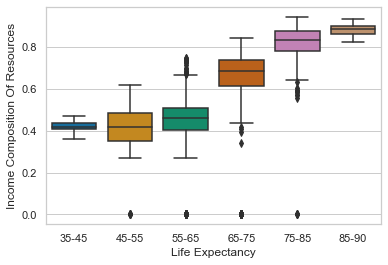

In [170]:
sns.boxplot(y='Income Composition Of Resources', x='Life Expectancy', 
                 data=df, 
                 palette="colorblind",)

### Visualization on Target Variable - Life Expectancy and Input Variable - Schooling

<AxesSubplot:xlabel='Life Expectancy', ylabel='Schooling'>

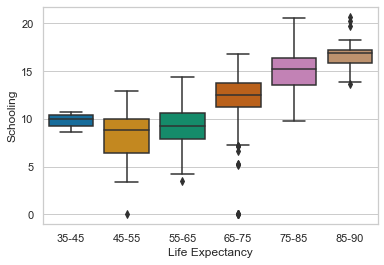

In [171]:
sns.boxplot(y='Schooling', x='Life Expectancy', 
                 data=df, 
                 palette="colorblind",)

In [28]:
#Numeric Varibales
df_Numeric = df[['Year','Life Expectancy','Adult Mortality','Infant Deaths','Alcohol','Hepatitis B',
             'Measles','BMI','Under-Five Deaths', 'Polio', 'Total Expenditure','Diphtheria', 'Hiv/Aids', 'GDP', 
             'Population', 'Thinness 1-19 Years','Thinness 5-9 Years', 'Income Composition Of Resources', 'Schooling']]


In [28]:
###finding count (number of non_missing values),unique values(or levels), top(mode) and freq(fequency of mode)

# Getting the summary of Data
pd.options.display.float_format = "{:.2f}".format

# for numeric columns
df_Numeric.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Year,2771.00,2007.61,4.58,2000.00,2004.00,2008.00,2012.00,2015.00
Adult Mortality,2768.00,163.52,124.90,1.00,72.00,142.00,226.00,723.00
Infant Deaths,2771.00,30.30,120.81,0.00,0.00,3.00,20.00,1800.00
Alcohol,2588.00,4.59,4.04,0.01,0.87,3.78,7.60,17.87
Hepatitis B,2543.00,79.35,25.00,1.00,73.00,90.00,96.00,99.00
Measles,2771.00,2382.18,11608.36,0.00,0.00,15.00,336.50,212183.00
BMI,2742.00,38.45,19.98,1.40,19.42,43.90,56.20,83.30
Under-Five Deaths,2771.00,42.04,164.30,0.00,0.00,3.00,25.00,2500.00
Polio,2755.00,82.64,23.23,3.00,78.00,93.00,97.00,99.00
Total Expenditure,2568.00,5.92,2.45,0.37,4.26,5.79,7.50,17.24


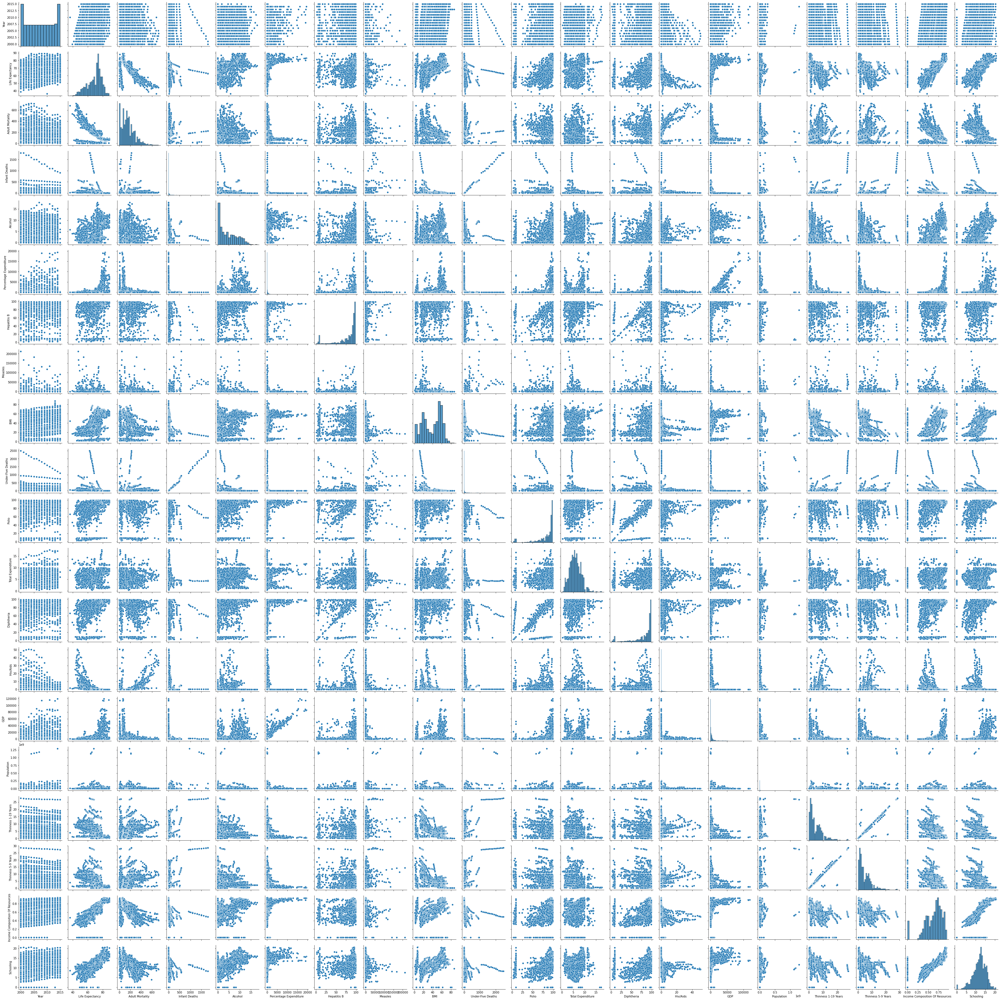

In [25]:
sns.pairplot(df_Numeric)
plt.show()

In [29]:
#Corr Relation for Numeric Variable
df_Numeric.corr()

,Year,Adult Mortality,Infant Deaths,Alcohol,Hepatitis B,Measles,BMI,Under-Five Deaths,Polio,Total Expenditure,Diphtheria,Hiv/Aids,GDP,Population,Thinness 1-19 Years,Thinness 5-9 Years,Income Composition Of Resources,Schooling
Year,1.00,-0.07,-0.04,-0.05,0.14,-0.08,0.10,-0.04,0.09,0.09,0.13,-0.14,0.10,0.03,-0.05,-0.05,0.24,0.21
Adult Mortality,-0.07,1.00,0.07,-0.19,-0.14,0.02,-0.38,0.09,-0.27,-0.10,-0.27,0.53,-0.30,-0.03,0.30,0.31,-0.46,-0.45
Infant Deaths,-0.04,0.07,1.00,-0.11,-0.21,0.50,-0.23,1.00,-0.17,-0.13,-0.17,0.02,-0.11,0.53,0.47,0.48,-0.15,-0.20
Alcohol,-0.05,-0.19,-0.11,1.00,0.06,-0.05,0.33,-0.11,0.22,0.29,0.22,-0.05,0.35,-0.02,-0.43,-0.41,0.45,0.55
Hepatitis B,0.14,-0.14,-0.21,0.06,1.00,-0.12,0.18,-0.22,0.48,0.07,0.59,-0.13,0.06,-0.09,-0.10,-0.12,0.20,0.24
Measles,-0.08,0.02,0.50,-0.05,-0.12,1.00,-0.17,0.51,-0.14,-0.10,-0.14,0.03,-0.08,0.24,0.23,0.22,-0.13,-0.14
BMI,0.10,-0.38,-0.23,0.33,0.18,-0.17,1.00,-0.24,0.29,0.23,0.29,-0.24,0.30,-0.05,-0.53,-0.54,0.51,0.56
Under-Five Deaths,-0.04,0.09,1.00,-0.11,-0.22,0.51,-0.24,1.00,-0.19,-0.13,-0.19,0.03,-0.11,0.52,0.47,0.48,-0.17,-0.21
Polio,0.09,-0.27,-0.17,0.22,0.48,-0.14,0.29,-0.19,1.00,0.14,0.68,-0.16,0.21,-0.03,-0.22,-0.23,0.38,0.42
Total Expenditure,0.09,-0.10,-0.13,0.29,0.07,-0.10,0.23,-0.13,0.14,1.00,0.15,0.01,0.14,-0.01,-0.27,-0.28,0.17,0.25


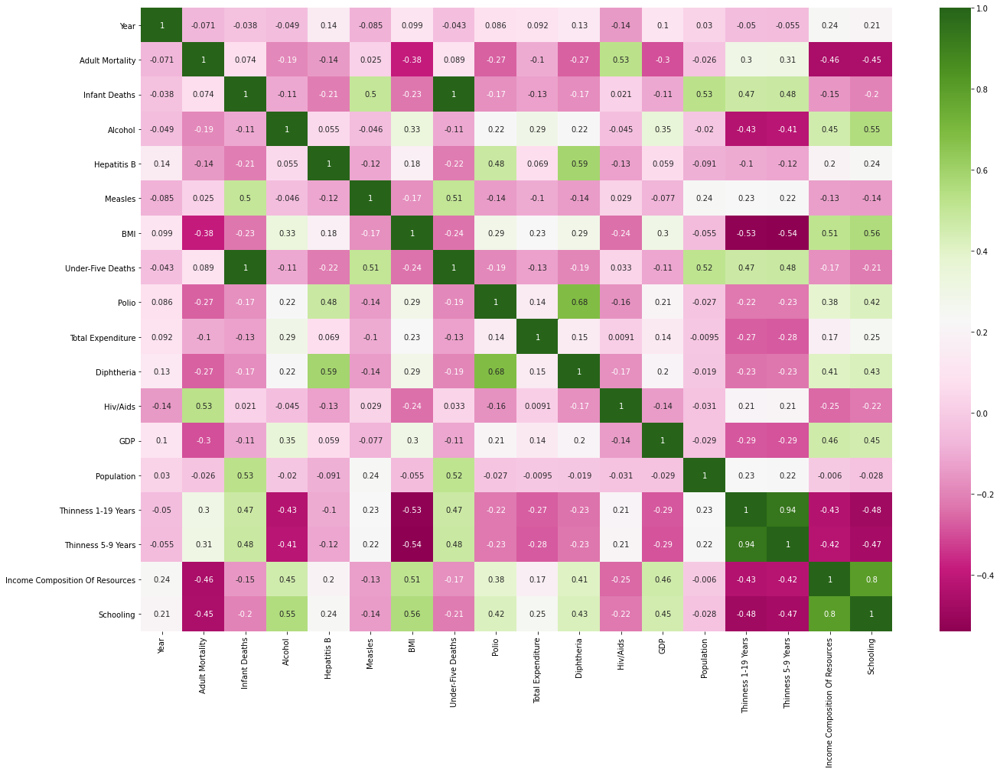


Multi-Collinearity Feature Infant Deaths and Feature Under-Five Deaths ==> Correlation Score 0.9966398699231359

Multi-Collinearity Feature Under-Five Deaths and Feature Infant Deaths ==> Correlation Score 0.9966398699231359

Multi-Collinearity Feature Thinness 1-19 Years and Feature Thinness 5-9 Years ==> Correlation Score 0.9371542539499359

Multi-Collinearity Feature Thinness 5-9 Years and Feature Thinness 1-19 Years ==> Correlation Score 0.9371542539499359

Multi-Collinearity Feature Income Composition Of Resources and Feature Schooling ==> Correlation Score 0.8025761354426174

Multi-Collinearity Feature Schooling and Feature Income Composition Of Resources ==> Correlation Score 0.8025761354426174


In [30]:
import seaborn as sns

corrmat = df_Numeric.corr()
plt.figure(figsize=(22, 15))
sns.heatmap(corrmat,annot=True, cmap='PiYG')
plt.show()

for i in range(len(corrmat.columns)):
  for j in range(len(corrmat.index)):
    if corrmat.iloc[i,j]>0.80 and corrmat.iloc[i,j] != 1.0:
      print('\nMulti-Collinearity Feature {} and Feature {} ==> Correlation Score {}'.format(corrmat.columns[i],corrmat.columns[j],corrmat.iloc[i,j]))

### 3 pairs of features have high correlation

1. infant_deaths and under-five_deaths

2. thinness_1-19 years and thinness_5-9 years

3. Income_composition_of_resources and Schooling

Best Option to deal with Multicollinearity is to remove any one feature

### Removing the Multicollinearity Variables

In [29]:
## Drop columns which are not significant
df.drop(['Under-Five Deaths','Thinness 5-9 Years','Income Composition Of Resources'],axis=1,inplace=True)

In [30]:
df.columns

Index(['Country', 'Year', 'Status', 'Life Expectancy', 'Adult Mortality',
       'Infant Deaths', 'Alcohol', 'Hepatitis B', 'Measles', 'BMI', 'Polio',
       'Total Expenditure', 'Diphtheria', 'Hiv/Aids', 'GDP', 'Population',
       'Thinness 1-19 Years', 'Schooling'],
      dtype='object')

### We should convert our categorical column to numeric before spliting for this I use One Hot Encoding as my categorical variable in Nominal

In [31]:
from sklearn.preprocessing import OneHotEncoder
import category_encoders as ce

In [32]:
df['Country']=df[({'Country':[
'Afghanistan', 'Albania', 'Algeria', 'Angola',
       'Antigua and Barbuda', 'Bahrain', 'Barbados',
       'Bolivia (Plurinational State of)', 'Brunei Darussalam', 'Cuba',
       'Czechia', 'Grenada', 'Iran (Islamic Republic of)', 'Kuwait',
       'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan',
       'Bahamas', 'Libya', 'Micronesia (Federated States of)',
       'New Zealand', 'Oman', 'Qatar', 'Saudi Arabia', 'Singapore',
       'Bangladesh', 'United Arab Emirates', "Côte d'Ivoire", 'Congo',
       'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'The former Yugoslav republic of Macedonia', 'Yemen', 'Bulgaria',
       'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon',
       'Canada', 'Central African Republic', 'Chad', 'Chile', 'China',
       'Colombia', 'Comoros', 'Costa Rica', 'Croatia', 'Cyprus',
       'Slovakia', 'Somalia',
       'United Kingdom of Great Britain and Northern Ireland',
       'United Republic of Tanzania',
       'Venezuela (Bolivarian Republic of)', 'Viet Nam',
       "Democratic People's Republic of Korea",
       'Democratic Republic of the Congo', 'Egypt', 'Gambia',
       'Kyrgyzstan', 'Denmark', 'Djibouti', 'Dominican Republic',
       'Ecuador', 'Republic of Korea', 'Republic of Moldova',
       'Saint Lucia', 'Saint Vincent and the Grenadines', 'El Salvador',
       'Equatorial Guinea', 'Eritrea', 'Estonia', 'Ethiopia', 'Fiji',
       'Finland', 'France', 'Gabon', "Lao People's Democratic Republic",
       'Georgia', 'Germany', 'Ghana', 'Greece', 'Guatemala', 'Guinea',
       'Guinea-Bissau', 'Guyana', 'Haiti', 'Honduras', 'Hungary',
       'Iceland', 'India', 'Indonesia', 'Iraq', 'Ireland', 'Israel',
       'Italy', 'Jamaica', 'Japan', 'Jordan', 'Kazakhstan', 'Kenya',
       'Kiribati', 'Latvia', 'Lebanon', 'Lesotho', 'Liberia',
       'United States of America', 'Lithuania', 'Luxembourg',
       'Madagascar', 'Malawi', 'Malaysia', 'Maldives', 'Mali', 'Malta',
       'Mauritania', 'Mauritius', 'Mexico', 'Mongolia', 'Montenegro',
       'Morocco', 'Mozambique', 'Myanmar', 'Namibia', 'Nepal',
       'Netherlands', 'Nicaragua', 'Niger', 'Nigeria', 'Norway',
       'Pakistan', 'Palau', 'Panama', 'Papua New Guinea', 'Paraguay',
       'Peru', 'Philippines', 'Poland', 'Portugal', 'Romania',
       'Russian Federation', 'Rwanda', 'Samoa', 'Sao Tome and Principe',
       'Senegal', 'Serbia', 'Seychelles', 'Sierra Leone', 'Slovenia',
       'Solomon Islands', 'South Africa', 'South Sudan', 'Spain',
       'Sri Lanka', 'Sudan', 'Suriname', 'Swaziland', 'Sweden',
       'Switzerland', 'Syrian Arab Republic', 'Tajikistan', 'Thailand',
       'Dominica', 'Timor-Leste', 'Togo', 'Tonga', 'Trinidad and Tobago',
       'Tunisia', 'Turkey', 'Turkmenistan', 'Uganda', 'Ukraine',
       'Marshall Islands', 'Uruguay', 'Uzbekistan', 'Vanuatu', 'Zambia',
       'Zimbabwe']})]

#Create object for one-hot encoding
encoder=ce.OneHotEncoder(cols='Country',handle_unknown='return_nan',return_df=True,use_cat_names=True)

#Fit and transform Data
df = encoder.fit_transform(df)
df

,Country_Afghanistan,Country_Albania,Country_Algeria,Country_Angola,Country_Antigua and Barbuda,Country_Bahrain,Country_Barbados,Country_Bolivia (Plurinational State of),Country_Brunei Darussalam,Country_Cuba,...,Measles,BMI,Polio,Total Expenditure,Diphtheria,Hiv/Aids,GDP,Population,Thinness 1-19 Years,Schooling
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1154,19.1,6.0,8.16,65.0,0.1,584.26,33736494.0,17.2,10.1
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,492,18.6,58.0,8.18,62.0,0.1,612.70,327582.0,17.5,10.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,430,18.1,62.0,8.13,64.0,0.1,631.74,31731688.0,17.7,9.9
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2787,17.6,67.0,8.52,67.0,0.1,669.96,3696958.0,17.9,9.8
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3013,17.2,68.0,7.87,68.0,0.1,63.54,2978599.0,18.2,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2766,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,31,27.1,67.0,7.13,65.0,33.6,454.37,12777511.0,9.4,9.2
2767,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,998,26.7,7.0,6.52,68.0,36.7,453.35,12633897.0,9.8,9.5
2768,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,304,26.3,73.0,6.53,71.0,39.8,57.35,125525.0,1.2,10.0
2769,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,529,25.9,76.0,6.16,75.0,42.1,548.59,12366165.0,1.6,9.8


#### Converting Status to Numeric

In [33]:
df['Status'] = df['Status'].map({'Developed': 1, 'Developing': 0})
df['Status']

0       0
1       0
2       0
3       0
4       0
       ..
2766    0
2767    0
2768    0
2769    0
2770    0
Name: Status, Length: 2137, dtype: int64

##### There is a crucial assumption made by any supervised ML approach: both the training set and the set are samples drawn from 
the same population.This means that the model expects to see the same distribution of features in 
the test set as in the training set.In order to make sure that this assumption is satisfied, 
it is important to shuffle the instances before splitting between training set and test set. 
This will avoid any visible or invisible bias due to the order in which the data was collected or assembled. 
from sklearn.utils import shuffle

### Shuffling Data

In [34]:
# shuffle the dataframe
from sklearn.utils import shuffle
df = shuffle(df, random_state=0)
print(df.head())

      Country_Afghanistan  Country_Albania  Country_Algeria  Country_Angola  \
942                   0.0              0.0              0.0             0.0   
2221                  0.0              0.0              0.0             0.0   
2698                  0.0              0.0              0.0             0.0   
2689                  0.0              0.0              0.0             0.0   
2012                  0.0              0.0              0.0             0.0   

      Country_Antigua and Barbuda  Country_Bahrain  Country_Barbados  \
942                           0.0              0.0               0.0   
2221                          0.0              0.0               0.0   
2698                          0.0              0.0               0.0   
2689                          0.0              0.0               0.0   
2012                          0.0              0.0               0.0   

      Country_Bolivia (Plurinational State of)  Country_Brunei Darussalam  \
942            

### Now we begin to train the Logistic Regression model.

We will need to first split up our data into an X array that contains the features to train on, 
and a y array with the target variable, in this case, Life Expectancy

In [35]:
# Extract dependent & Independent Variable

X = df.drop("Life Expectancy",axis=1)
y = df["Life Expectancy"]

X.head(5)

,Country_Afghanistan,Country_Albania,Country_Algeria,Country_Angola,Country_Antigua and Barbuda,Country_Bahrain,Country_Barbados,Country_Bolivia (Plurinational State of),Country_Brunei Darussalam,Country_Cuba,...,Measles,BMI,Polio,Total Expenditure,Diphtheria,Hiv/Aids,GDP,Population,Thinness 1-19 Years,Schooling
942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,12289,2.7,8.0,3.70,78.0,3.5,39.48,19924522.0,8.8,7.6
2221,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,49.7,94.0,5.50,88.0,0.1,29.65,57554.0,1.1,9.6
2698,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,101,42.6,67.0,3.52,7.0,0.1,1353.93,193956.0,1.7,10.2
2689,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,49.9,65.0,3.85,65.0,0.1,3275.92,241871.0,1.5,10.8
2012,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,14,52.4,98.0,4.57,98.0,0.1,2124.87,2173496.0,3.7,12.0


In [36]:
y.head()

942     55-65
2221    65-75
2698    65-75
2689    65-75
2012    75-85
Name: Life Expectancy, dtype: category
Categories (6, object): ['35-45' < '45-55' < '55-65' < '65-75' < '75-85' < '85-90']

### Balance of data

A balanced dataset is the one that contains equal or almost equal number of samples from the positive and negative class. 
If the samples from one of the classes outnumbers the other , the data is skewed in favour of one of the class.

In [37]:
y.value_counts()

65-75    948
75-85    614
55-65    355
45-55    175
85-90     36
35-45      9
Name: Life Expectancy, dtype: int64

In [38]:
y.shape

(2137,)

Checking the percentage for unbalance Data

In [39]:
per_1 = 948/2137
per_2 = 616/2137
per_3 = 355/2137
per_4 = 175/2137
per_5 = 36/2137
per_6 = 9/2137
print('Percenatge of 65-75 ==>',per_1*100)
print('Percenatge of 75-85 ==>',per_2*100)
print('Percenatge of 55-65 ==>',per_3*100)
print('Percenatge of 45-55 ==>',per_4*100)
print('Percenatge of 85-90 ==>',per_5*100)
print('Percenatge of 35-45 ==>',per_6*100)

Percenatge of 65-75 ==> 44.36125409452504
Percenatge of 75-85 ==> 28.825456247075337
Percenatge of 55-65 ==> 16.612072999532053
Percenatge of 45-55 ==> 8.189050070191858
Percenatge of 85-90 ==> 1.6846045858680394
Percenatge of 35-45 ==> 0.42115114646700985


It can be seen that the data is imbalanced with 44 percentage of the data belonging to 65-75 and so on which is the Life Expectancy,to deal with this we should do oversampling 

In [59]:

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_scaled = pd.DataFrame(sc.fit_transform(X),columns = X.columns)
X_scaled.head()

,Country_Afghanistan,Country_Albania,Country_Algeria,Country_Angola,Country_Antigua and Barbuda,Country_Bahrain,Country_Barbados,Country_Bolivia (Plurinational State of),Country_Brunei Darussalam,Country_Cuba,...,Measles,BMI,Polio,Total Expenditure,Diphtheria,Hiv/Aids,GDP,Population,Thinness 1-19 Years,Schooling
0,-0.086854,-0.086854,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,...,1.152147,-1.850164,-3.383832,-0.912845,-0.268588,0.325452,-0.541519,0.111819,0.985494,-1.528901
1,-0.086854,-0.086854,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,...,-0.211184,0.528254,0.445477,-0.161569,0.176628,-0.302281,-0.542184,-0.203952,-0.808909,-0.891057
2,-0.086854,-0.086854,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,...,-0.199979,0.168961,-0.756748,-0.987972,-3.429622,-0.302281,-0.452548,-0.201784,-0.669086,-0.699703
3,-0.086854,-0.086854,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,...,-0.211184,0.538375,-0.845802,-0.850239,-0.847369,-0.302281,-0.322456,-0.201022,-0.715694,-0.508350
4,-0.086854,-0.086854,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,-0.084076,...,-0.209631,0.664886,0.623584,-0.549728,0.621844,-0.302281,-0.400366,-0.170320,-0.203007,-0.125644


In [60]:

#Split into training and test set for cross-validation with test_size = 0.20
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(X_scaled,y,random_state=0,test_size=0.25)
X_test.head()
#Train-Test split for X_scaled features.

## Print the shape of X_train, X_test, y_train, y_test
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(1602, 173)
(535, 173)
(1602,)
(535,)


#### Random Oversampling Imbalanced Datasets

Random oversampling involves randomly duplicating examples from the minority class and adding them to the training dataset.

Examples from the training dataset are selected randomly with replacement. This means that examples from the minority class can be chosen and added to the new “more balanced” training dataset multiple times; they are selected from the original training dataset, added to the new training dataset, and then returned or “replaced” in the original dataset, allowing them to be selected again.

This technique can be effective for those machine learning algorithms that are affected by a skewed distribution and where multiple duplicate examples for a given class can influence the fit of the model. This might include algorithms that iteratively learn coefficients, like artificial neural networks that use stochastic gradient descent. It can also affect models that seek good splits of the data, such as support vector machines and decision trees.

It might be useful to tune the target class distribution. In some cases, seeking a balanced distribution for a severely imbalanced dataset can cause affected algorithms to overfit the minority class, leading to increased generalization error. The effect can be better performance on the training dataset, but worse performance on the holdout or test dataset.

#### Synthetic Minority Oversampling Technique
A problem with imbalanced classification is that there are too few examples of the minority class for a model to effectively learn the decision boundary.

One way to solve this problem is to oversample the examples in the minority class. This can be achieved by simply duplicating examples from the minority class in the training dataset prior to fitting a model. This can balance the class distribution but does not provide any additional information to the model.

An improvement on duplicating examples from the minority class is to synthesize new examples from the minority class. This is a type of data augmentation for tabular data and can be very effective.

Perhaps the most widely used approach to synthesizing new examples is called the Synthetic Minority Oversampling TEchnique, or SMOTE for short. This technique was described by Nitesh Chawla, et al. in their 2002 paper named for the technique titled “SMOTE: Synthetic Minority Over-sampling Technique.”

SMOTE works by selecting examples that are close in the feature space, drawing a line between the examples in the feature space and drawing a new sample at a point along that line.

Specifically, a random example from the minority class is first chosen. Then k of the nearest neighbors for that example are found (typically k=5). A randomly selected neighbor is chosen and a synthetic example is created at a randomly selected point between the two examples in feature space.

###  I will be using SMOT to do oversampling to treat the imbalance in my dataset

In [73]:
pip install -U imbalanced-learn

Note: you may need to restart the kernel to use updated packages.


In [69]:
pip install imbalanced-learn

Note: you may need to restart the kernel to use updated packages.


In [42]:
print("Number transactions X_train dataset: ", X_train.shape)
print("Number transactions y_train dataset: ", y_train.shape)
print("Number transactions X_test dataset: ", X_test.shape)
print("Number transactions y_test dataset: ", y_test.shape)

Number transactions X_train dataset:  (1602, 173)
Number transactions y_train dataset:  (1602,)
Number transactions X_test dataset:  (535, 173)
Number transactions y_test dataset:  (535,)


In [43]:
from imblearn.over_sampling import SMOTE

In [61]:
oversample = SMOTE()
sm = SMOTE(random_state=2)
X_train_sm, y_train_sm = oversample.fit_resample(X_train, y_train)


print('After OverSampling, the shape of train_X: {}'.format(X_train_sm.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_sm.shape))


After OverSampling, the shape of train_X: (4200, 173)
After OverSampling, the shape of train_y: (4200,) 



### Feature Scalling

In [62]:
##Feature scaling is done on X dataset

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train_scaled = pd.DataFrame(sc.fit_transform(X_train_sm),columns=X.columns)
X_test_scaled = pd.DataFrame(sc.transform(X_test),columns=X.columns)


## Applying Logistic Regression Model

In [63]:
#import Logistic Regression 
#https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html
log_model = LogisticRegression(max_iter=500,tol=0.001,solver='liblinear')
log_model.fit(X_train_sm,y_train_sm)

LogisticRegression(max_iter=500, solver='liblinear', tol=0.001)

In [64]:
log_model.intercept_ #b0

array([-7.32876244, -6.40614052, -4.16781629, -1.71022615, -3.1952021 ,
       -6.82007128])

In [65]:
log_model.coef_ #coefficients of the features, b1, b2, ...

array([[ 0.22832558,  0.12358891,  0.33795999, ..., -0.84204537,
        -0.23415593,  1.12960391],
       [ 0.08948561, -0.20234058, -0.01893414, ...,  0.5733363 ,
        -1.27523746, -2.39677091],
       [ 0.28279617, -0.22819756, -0.19926118, ...,  0.18801058,
         1.34537352,  0.15265757],
       [-0.83632647, -0.18198613,  0.04574242, ..., -0.3164005 ,
        -0.3190528 , -0.07154335],
       [-0.04398412,  0.31924152,  0.12745988, ...,  0.46332724,
        -0.30462611,  1.5330073 ],
       [ 0.12420098, -0.1135317 ,  0.08977737, ...,  0.06848434,
        -0.09047067,  0.99198767]])

In [66]:
#Predict_proba gives the probabilities P(y=Ci|x)
log_model.predict_proba(X_test)

array([[1.18019488e-03, 3.64524207e-02, 2.87819739e-03, 9.52279829e-01,
        7.02337409e-03, 1.85983514e-04],
       [1.15635111e-06, 1.96202727e-04, 8.76923997e-03, 9.84037052e-01,
        6.53792970e-03, 4.58418781e-04],
       [1.19663734e-03, 1.76113897e-03, 2.34496005e-03, 1.76217063e-03,
        9.92381819e-01, 5.53273684e-04],
       ...,
       [7.67679989e-04, 1.80905083e-02, 2.04592012e-03, 9.75671186e-01,
        3.15510982e-03, 2.69595868e-04],
       [1.90194467e-04, 2.92810708e-03, 9.57022412e-01, 3.89261173e-02,
        8.06708122e-04, 1.26460933e-04],
       [1.00491965e-04, 7.54765281e-01, 2.38215044e-01, 4.94422311e-03,
        1.87688053e-03, 9.80794181e-05]])

In [67]:
probabilities_test = log_model.predict_proba(X_test)[:,1]
probabilities_test[10:20] #second column belongs to class 1, ie, p = P(y=1|x)

array([3.63286962e-03, 4.30325963e-02, 9.02756061e-05, 6.80761968e-05,
       1.01980489e-04, 1.24504775e-03, 5.70186590e-04, 5.84660246e-04,
       6.93491886e-03, 8.11209153e-03])

In [68]:
#Whereas predict method gives the class prediction as either 0 or 1
y_predict = log_model.predict(X_test)
y_predict[10:20]

array(['75-85', '65-75', '65-75', '65-75', '65-75', '75-85', '65-75',
       '75-85', '65-75', '75-85'], dtype=object)

In [69]:
#Predictions based on a different threshold value
from sklearn.preprocessing import binarize
y_predict_thresh = binarize(probabilities_test.reshape(-1,1),threshold=0.5)
y_predict_thresh[10:20]

array([[0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.]])

In [70]:
#Performance measures for classification
#Accuracy = total no. of correct prediction/total no. of datapoints

log_model.score(X_test,y_test)

0.7831775700934579

In [71]:
from sklearn.metrics import accuracy_score, confusion_matrix
accuracy_score(y_test,y_predict)

0.7831775700934579

In [72]:
'''
        Predicted
        0   1
True  0 TN  FP
      1 FN  TP

'''
cm1 = confusion_matrix(y_test,y_predict)
print(cm1)

[[  1   0   0   0   0   0]
 [  4  30   1   0   0   0]
 [  1   9  71  10   0   0]
 [  0   1  27 205  15   0]
 [  1   0   0  18 110  21]
 [  0   0   0   0   8   2]]


In [73]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

       35-45       0.14      1.00      0.25         1
       45-55       0.75      0.86      0.80        35
       55-65       0.72      0.78      0.75        91
       65-75       0.88      0.83      0.85       248
       75-85       0.83      0.73      0.78       150
       85-90       0.09      0.20      0.12        10

    accuracy                           0.78       535
   macro avg       0.57      0.73      0.59       535
weighted avg       0.81      0.78      0.80       535



In [107]:
print("Cross Validation of X and y Train: ")
lr_cvt = cross_val_score(log_model,X_train_sm,y_train_sm, cv=5).mean()
print(lr_cvt)
print("..........."*10)
print("Train Accuracy Score: ",log_model.score(X_train_sm,y_train_sm)) 
print("..........."*10)
y_pred = log_model.predict(X_test)
print("Test Accuracy Score: ",log_model.score(X_test,y_test))  
print("..........."*10)
print("Confusion Matrix")
print(" ")
print(confusion_matrix(y_test, y_pred))
print("..........."*10)
print("Classification Report")
print(" ")
print(classification_report(y_test,y_pred))

Cross Validation of X and y Train: 
0.8895238095238096
..............................................................................................................
Train Accuracy Score:  0.9045238095238095
..............................................................................................................
Test Accuracy Score:  0.7831775700934579
..............................................................................................................
Confusion Matrix
 
[[  1   0   0   0   0   0]
 [  4  30   1   0   0   0]
 [  1   9  71  10   0   0]
 [  0   1  27 205  15   0]
 [  1   0   0  18 110  21]
 [  0   0   0   0   8   2]]
..............................................................................................................
Classification Report
 
              precision    recall  f1-score   support

       35-45       0.14      1.00      0.25         1
       45-55       0.75      0.86      0.80        35
       55-65       0.72      0.78      0.75      

###### Conclusion :
    
    Our Classification Model has CV value is .88 and test accuracy of .78 which is a very good fit and can even be considered for real world modelling.

## Applying The k-nearest neighbors Classifier (KNN Classifier)

In [75]:
#import the knn model
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score 

knn_log_model = KNeighborsClassifier()
knn_log_model.fit(X_train,y_train)
predicted_classes = knn_log_model.predict(X)
accuracy = accuracy_score(y,predicted_classes)

In [76]:
print('Accuracy on Regression KNN Model: ',accuracy)
print(knn_log_model)

Accuracy on Regression KNN Model:  0.17828731867103417
KNeighborsClassifier()


In [77]:
knn_log_model.fit(X_test , y_test)
predicted_classes_test = knn_log_model.predict(X_test)
accuracy = accuracy_score(y_test,predicted_classes_test)
print('Accuracy on Predicted Regression KNN Model : ',accuracy)

Accuracy on Predicted Regression KNN Model :  0.8504672897196262


##### Search Grid for Hyper paramenter tuning

In [78]:
knn_classifier = KNeighborsClassifier(algorithm='brute',weights='distance')
params = {'n_neighbors':[1,11,25],'metric':["euclidean",'cityblock']}
grid = GridSearchCV(knn_classifier,param_grid=params,scoring='accuracy',cv=10)

In [79]:
grid.fit(X_train,y_train)
print(grid.best_score_)
print(grid.best_params_)

0.8844992236024843
{'metric': 'cityblock', 'n_neighbors': 1}


In [80]:
best_knn = grid.best_estimator_
pred_train = best_knn.predict(X_train) 
pred_test = best_knn.predict(X_test)

Cross Validation Score of X & y: 0.48011743498197346
 
Cross Validation Score of X_train & y_train: 0.8776652119700747
 
train Accuracy: 1.0
 
test Accuracy: 0.8542056074766355
 
              precision    recall  f1-score   support

       35-45       0.00      0.00      0.00         1
       45-55       0.74      0.89      0.81        35
       55-65       0.88      0.78      0.83        91
       65-75       0.91      0.90      0.90       248
       75-85       0.84      0.88      0.86       150
       85-90       0.17      0.10      0.12        10

    accuracy                           0.85       535
   macro avg       0.59      0.59      0.59       535
weighted avg       0.85      0.85      0.85       535



array([[  0,   1,   0,   0,   0,   0],
       [  3,  31,   1,   0,   0,   0],
       [  0,  10,  71,  10,   0,   0],
       [  0,   0,   9, 222,  17,   0],
       [  0,   0,   0,  13, 132,   5],
       [  0,   0,   0,   0,   9,   1]], dtype=int64)

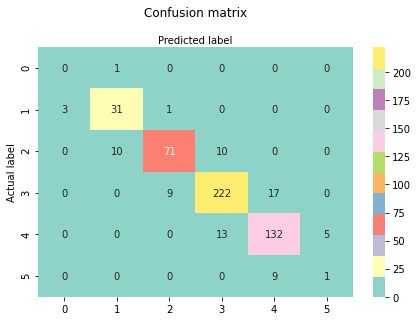

In [81]:
# Cross Validation
knn_cvb = cross_val_score(best_knn,X,y,cv=4).mean()
print('Cross Validation Score of X & y:',knn_cvb)
print(" ")

# Cross Validation
knn_cvt = cross_val_score(best_knn,X_train,y_train,cv=4).mean()

print('Cross Validation Score of X_train & y_train:',knn_cvt)
print(" ")


#Train Accuracy

knn_train = best_knn.score(X_train,y_train)

print('train Accuracy:',knn_train)
print(" ")
#Test Accuracy

knn_test = best_knn.score(X_test,y_test)

print('test Accuracy:',knn_test)
print(" ")

#Classification Report & Confusion Matrix
from sklearn.metrics import classification_report
y_pred = best_knn.predict(X_test)

from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test,y_pred)
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)

# create heatmap
sns.heatmap(pd.DataFrame(cm), annot=True, cmap="Set3" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
print(classification_report(y_test,y_pred))
confusion_matrix(y_test,y_pred)

For multi class we are not doing ROC 

    ###### Conclusion :
    
    Our KNN Model analysis value has CV score of .87 and test accuracy score of 0.85 which is a good fit 
    and can even be considered for real world modelling.

## Random Forest Classifier

In [82]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier()
print(rfc)

RandomForestClassifier()


In [83]:
rfc.fit(X_train,y_train)
## Predict
rfc_train_predictions = rfc.predict(X_train)
rfc_test_predictions = rfc.predict(X_test)

### Train data accuracy
from sklearn.metrics import accuracy_score
print('Train Data Accuracy on Random Forest Model: ',accuracy_score(y_train,rfc_train_predictions))
      
### Test data accuracy
print('Test Data Accuracy on Random Forest Model: ',accuracy_score(y_test,rfc_test_predictions))

Train Data Accuracy on Random Forest Model:  1.0
Test Data Accuracy on Random Forest Model:  0.8841121495327103


###### Search Grid for Hyper paramenter tuning

In [84]:
from sklearn.model_selection import RandomizedSearchCV

## n_jobs = -1 uses all cores of processor
## max_features is the maximum number of attributes to select for each tree
rfc_grid = RandomForestClassifier(n_jobs=-1, max_features='sqrt', class_weight='balanced_subsample')
 
# Use a grid over parameters of interest
## n_estimators is the number of trees in the forest
## max_depth is how deep each tree can be
## min_sample_leaf is the minimum samples required in each leaf node for the root node to split
## "A node will only be split if in each of it's leaf nodes there should be min_sample_leaf"
 
param_grid = {"n_estimators" : [10, 25, 50, 75, 100],
           "max_depth" : [10, 12, 14, 16, 18, 20],
           "min_samples_leaf" : [5, 10, 15, 20]}
 
rfc_cv_grid = RandomizedSearchCV(estimator = rfc_grid, param_distributions = param_grid, cv = 3, n_iter=10)
rfc_cv_grid.fit(X_train, y_train)
rfc_cv_grid.best_estimator_
best_rfc = rfc_cv_grid.best_estimator_
best_rfc.fit(X_train, y_train)


RandomForestClassifier(class_weight='balanced_subsample', max_depth=20,
                       max_features='sqrt', min_samples_leaf=5, n_estimators=50,
                       n_jobs=-1)

In [85]:
## Predict
rfc2_train_predictions = best_rfc.predict(X_train)
rfc2_test_predictions = best_rfc.predict(X_test)

print('Predicted Random Forest: ',accuracy_score(y_train,rfc2_train_predictions))
      
### Test data accuracy
print('Test Data Accuracy: ',accuracy_score(y_test,rfc2_test_predictions))

Predicted Random Forest:  0.9051186017478152
Test Data Accuracy:  0.8242990654205608


Cross Validation Score of X & y: 0.8245090832720781
 
Cross Validation Score of X_train & y_train: 0.8108728179551122
 
train Accuracy: 0.9051186017478152
 
test Accuracy: 0.8242990654205608
 
              precision    recall  f1-score   support

       35-45       0.00      0.00      0.00         1
       45-55       0.70      0.86      0.77        35
       55-65       0.77      0.74      0.75        91
       65-75       0.86      0.90      0.88       248
       75-85       0.88      0.80      0.84       150
       85-90       0.00      0.00      0.00        10

    accuracy                           0.82       535
   macro avg       0.53      0.55      0.54       535
weighted avg       0.82      0.82      0.82       535



array([[  0,   1,   0,   0,   0,   0],
       [  1,  30,   4,   0,   0,   0],
       [  0,  11,  67,  13,   0,   0],
       [  0,   1,  16, 224,   7,   0],
       [  0,   0,   0,  23, 120,   7],
       [  0,   0,   0,   0,  10,   0]], dtype=int64)

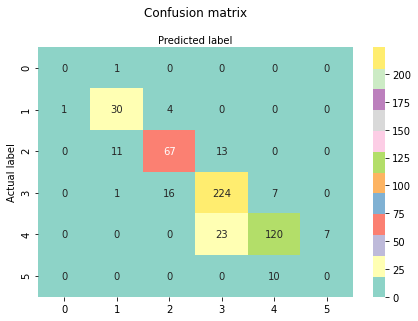

In [86]:
# Cross Validation
best_rfcvb = cross_val_score(best_rfc,X,y,cv=4).mean()
print('Cross Validation Score of X & y:',best_rfcvb)
print(" ")

# Cross Validation
best_rfcvt = cross_val_score(best_rfc,X_train,y_train,cv=4).mean()

print('Cross Validation Score of X_train & y_train:',best_rfcvt)
print(" ")

#Train Accuracy

rfc_train =best_rfc.score(X_train,y_train)

print('train Accuracy:',rfc_train)
print(" ")
#Test Accuracy

rfc_test = best_rfc.score(X_test,y_test)

print('test Accuracy:',rfc_test)
print(" ")

#Classification Report & Confusion Matrix
from sklearn.metrics import classification_report
y_pred = best_rfc.predict(X_test)

from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test,y_pred)
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)

# create heatmap
sns.heatmap(pd.DataFrame(cm), annot=True, cmap="Set3" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

print(classification_report(y_test,y_pred))
confusion_matrix(y_test,y_pred)

###### Conclusion :
    
        Our Random Forest Model analysis value has CV score .80 and test accuracy score of 0.82 which is a very good fit and can even be considered for real world  modelling.

## AdaBoost Classifier

In [87]:
# import modules as necessary
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

adb_log_model = AdaBoostClassifier()

In [88]:
# Create adaboost-decision tree classifer object
Adaboost_model = AdaBoostClassifier(
    DecisionTreeClassifier(max_depth=2),
    n_estimators = 600,
    learning_rate = 1)

In [89]:
# Train model
adb_log_model.fit(X_train, y_train)

AdaBoostClassifier()

In [90]:
# Predict on Train 
train_preds = adb_log_model.predict(X_train)
# Predict on Test 
test_preds = adb_log_model.predict(X_test)

In [91]:
print('Predicted Adaboost Train Model: ',accuracy_score(y_train, train_preds))
print('Predicted Adaboost Test Model: ',accuracy_score(y_test, test_preds))

Predicted Adaboost Train Model:  0.5143570536828964
Predicted Adaboost Test Model:  0.525233644859813


###### Search Grid for Hyper paramenter tuning

In [92]:
from sklearn.model_selection import GridSearchCV

param_grid = {'n_estimators' : [100, 150, 200],
              'learning_rate' : [0.1, 0.5, 0.9]}

Adaboost_model_clf = GridSearchCV(AdaBoostClassifier(
            DecisionTreeClassifier(max_depth=2)), param_grid, n_jobs=-1)

In [93]:
# Train model
Adaboost_model_clf.fit(X_train, y_train)

GridSearchCV(estimator=AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=2)),
             n_jobs=-1,
             param_grid={'learning_rate': [0.1, 0.5, 0.9],
                         'n_estimators': [100, 150, 200]})

In [94]:
# Find best model
best_adb = Adaboost_model_clf.best_estimator_
print ('Adb Best Score:',Adaboost_model_clf.best_score_, Adaboost_model_clf.best_params_) 

Adb Best Score: 0.7365732087227415 {'learning_rate': 0.5, 'n_estimators': 150}


Cross Validation Score of X & y: 0.7136266582659527
 
Cross Validation Score of X_train & y_train: 0.7322116583541147
 
train Accuracy: 0.7615480649188514
 
test Accuracy: 0.7532710280373832
 
              precision    recall  f1-score   support

       35-45       0.00      0.00      0.00         1
       45-55       0.81      0.60      0.69        35
       55-65       0.77      0.75      0.76        91
       65-75       0.84      0.77      0.80       248
       75-85       0.67      0.81      0.74       150
       85-90       0.15      0.20      0.17        10

    accuracy                           0.75       535
   macro avg       0.54      0.52      0.53       535
weighted avg       0.77      0.75      0.76       535



array([[  0,   1,   0,   0,   0,   0],
       [  1,  21,  13,   0,   0,   0],
       [  0,   4,  68,  19,   0,   0],
       [  0,   0,   7, 190,  51,   0],
       [  0,   0,   0,  17, 122,  11],
       [  0,   0,   0,   0,   8,   2]], dtype=int64)

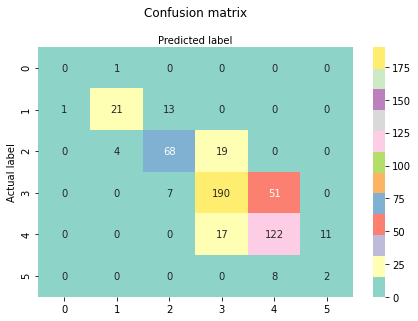

In [95]:
# Cross Validation
best_adbcv1 = cross_val_score(best_adb,X,y,cv=4).mean()
print('Cross Validation Score of X & y:',best_adbcv1)
print(" ")

# Cross Validation
best_adbcvt = cross_val_score(best_adb,X_train,y_train,cv=4).mean()

print('Cross Validation Score of X_train & y_train:',best_adbcvt)
print(" ")

#Train Accuracy

adb_train =best_adb.score(X_train,y_train)

print('train Accuracy:',adb_train)
print(" ")
#Test Accuracy

adb_test = best_adb.score(X_test,y_test)

print('test Accuracy:',adb_test)
print(" ")

#Classification Report & Confusion Matrix
from sklearn.metrics import classification_report
y_pred = best_adb.predict(X_test)

from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test,y_pred)
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)

# create heatmap
sns.heatmap(pd.DataFrame(cm), annot=True, cmap="Set3" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

print(classification_report(y_test,y_pred))
confusion_matrix(y_test,y_pred)

###### Conclusion :
    
    Our Adaboost Model analysis value has CV score 0.73 and test accuracy score of 0.75

## Model Comparison

In [108]:
models = [('Llogistics Regression', lr_cvt,lr_train,lr_test),
          ('k-nearest neighbors (KNN)',knn_cvt,knn_train,knn_test),
          ('Random Forest Classifier',best_rfcvt,rfc_train,rfc_test),
          ('Adaboost Cassifier',best_adbcvt,adb_train,adb_test)
         ]

In [109]:

predict = pd.DataFrame(data = models, columns=['Model','CV X_train & y_train','Train Accuracy','Test Accuracy'])
predict

,Model,CV X_train & y_train,Train Accuracy,Test Accuracy
0,Llogistics Regression,0.889524,0.904524,0.783178
1,k-nearest neighbors (KNN),0.877665,1.000000,0.854206
2,Random Forest Classifier,0.810873,0.905119,0.824299
3,Adaboost Cassifier,0.732212,0.761548,0.753271


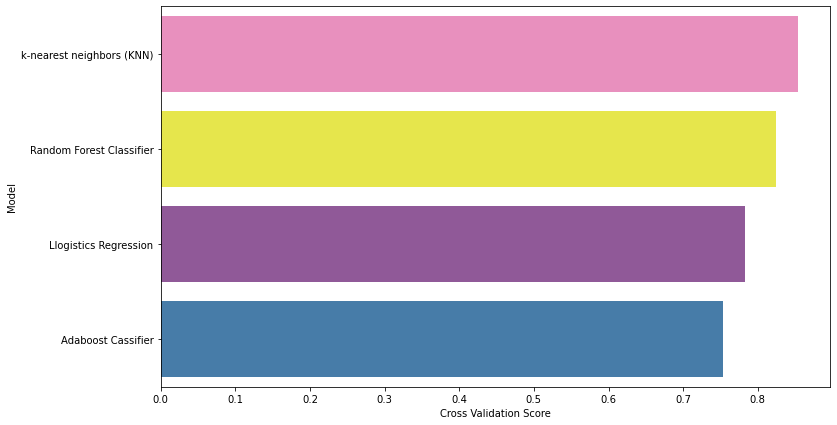

In [126]:
plt.figure(figsize=(12,7))
predict.sort_values(by=['Test Accuracy'], ascending=False, inplace=True)

sns.barplot(x='Test Accuracy', y='Model',data = predict, palette='Set1_r')
plt.xlabel('Cross Validation Score')
plt.ylabel('Model')
plt.show()


ValueError: 'set2' is not a valid value for name; supported values are 'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'mako', 'mako_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'rocket', 'rocket_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'vlag', 'vlag_r', 'winter', 'winter_r'

In [ ]:



CONCLUSION

--The highest average global life expectancy is between the range 65-75
--With the increase in the years, life expectancy has improved.
--Schooling has a positive relation with the life expectancy
--Immunization for diseases like Polio, Diphtheria and Hepatitis B has strong relation to life expectancy
--Adult Mortality and infant mortality does not increase the Life expectancy.
--Alcohol consumption is most likely effecting life expectancy in developing countries having invesrse relation.
--Income composition of resources too has a positive relation, hence life expectancy is higher in developed countries as their income composition and GDP is higher.
--On comparing different models we see that KNN is well suited with test accuracy of 85% and could be a good fit 
for real world too.

In [ ]:
RECOMMENDATION

Developing countries must focus more on immunization - Polio, Diphtheria and Hepatitis B

Schooling has a positive impact of life expectancy and developing countries must focus on this area. Same applies to GDP too.

The life expectancy is more or less the same for developed countries. Whereas in developing countries the life expectancy 
deteriorates as alcohol consumption increases and government must put restrictions on its usage.
